# Make Figures for Human Data

This notebook is used to make figures using data from human (K409, K411, K468, K484 and integrated objects) for the blood/tumor project. For each sample, there are at least two tissues (blood and tumor), and for each tissue there is a count matrix and a TCR metadata file. For K409, there is a tumor and lymph node (LN) sample, and for both K411 and K468, there blood and longitudinal blood samples.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.transforms import Bbox
import seaborn as sns
import scipy
import matplotlib as mpl
from matplotlib import cm                                                   # To make custom heat maps
from matplotlib.colors import ListedColormap, LinearSegmentedColormap       # To make custom color maps
import anndata
import scanpy as sc
from matplotlib.ticker import ScalarFormatter,MultipleLocator
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as ticker
from collections import Counter
from openpyxl import load_workbook
import xlsxwriter
import palettable
import os
from palettable.cartocolors.sequential import PurpOr_7
from matplotlib_venn import venn3_unweighted

# Set a seed
np.random.seed(2)

# Check to see if output directories exist

In [3]:
for folder in ['Figures', 'Outputs']:
    if not os.path.isdir(folder):
        os.mkdir(folder)

# Create Functions

### Create a Function to Save Subplots

In [2]:
# From https://stackoverflow.com/questions/4325733/save-a-subplot-in-matplotlib

def full_extent(ax, pad_x=0.0, pad_y=0.0):
    """Get the full extent of an axes, including axes labels, tick labels, and
    titles."""
    # For text objects, we need to draw the figure first, otherwise the extents
    # are undefined.
    ax.figure.canvas.draw()
    items = ax.get_xticklabels() + ax.get_yticklabels() 
    items += [ax, ax.title, ax.xaxis.label, ax.yaxis.label]
    bbox = Bbox.union([item.get_window_extent() for item in items])

    return bbox.expanded(1.0 + pad_x, 1.0 + pad_y)

### Create a Function to Make Titles for Sample Names

In [3]:
def MakeTitle(sample):
    """
    This function takes a string that is separated by underscores and 
    replaces the underscores with spaces.
    """
    
    return sample.replace('_', ' ')

# Create a Function to call only AB Clones

In [4]:
def AB_Clones(df, non_AB=False):
    """
    This function takes an Adata object and returns all the cells that have at least one alpha and
    one beta chain.
    
    The 'non_AB' option (Boolean) asks the user to specify if they want to return the non-AB cells as well.
    Default is False, meaning that only the AB cells will be returned.
    """
    
    df = df.copy()
    
    # Data frame with AB clones
    df_AB = df[ ~df['Matching'].isin(['notcr','alpha_chain_only','beta_chain_only']) ]
    
    # Data frame with non-AB clones
    df_non_AB = df[ df['Matching'].isin(['notcr','alpha_chain_only','beta_chain_only']) ]
    
    # If user asks to return the non-AB clones, return both    
    if non_AB:
        return df_AB, df_non_AB
    
    # Otherwise, return just the AB clones
    else:
        return df_AB

# Define sample names

In [5]:
samples = ['K409_Blood', 'K409_LN', 'K409_Tumor',
           'K411_Blood', 'K411_Blood_Longitudinal', 'K411_Tumor',
           'K468_Blood', 'K468_Blood_Longitudinal', 'K468_Tumor',
           'K484_Blood', 'K484_Tumor']

samples

['K409_Blood',
 'K409_LN',
 'K409_Tumor',
 'K411_Blood',
 'K411_Blood_Longitudinal',
 'K411_Tumor',
 'K468_Blood',
 'K468_Blood_Longitudinal',
 'K468_Tumor',
 'K484_Blood',
 'K484_Tumor']

# Make CombinedObject Class

In [6]:
class CombinedObject():
    """
    This data object, the CombinedObject, combines the count matrix and the metadata
    in the same data object. It allows for adding data from blood, tumor, LN, and longiudinal blood.
    """
    
    def __init__(self,sample,blood_meta,blood_mtx,tumor_meta,tumor_mtx):
        self.blood_meta = blood_meta.copy()
        self.blood_mtx  = blood_mtx.copy()
        self.blood      = True
        
        self.tumor_meta = tumor_meta.copy()
        self.tumor_mtx  = tumor_mtx.copy()
        self.tumor      = True
        self.ln         = False
        self.long       = False
        
        self.sample     = sample
    
    def __str__(self):
        return self.sample
        
    def add_ln(self,ln_meta,ln_mtx):
        self.ln_meta = ln_meta.copy()
        self.ln_mtx  = ln_mtx.copy()
        self.ln      = True
        
    def add_blood_long(self,long_meta,long_mtx):
        self.long_meta = long_meta.copy()
        self.long_mtx  = long_mtx.copy()
        self.long      = True
        
    def add_ln_tumor(self,ln_meta,ln_mtx,tumor_meta,tumor_mtx):
        ln_meta = ln_meta.copy()
        ln_meta.rename(index = lambda x: x+'_ln', inplace = True)
        ln_mtx.rename(index = lambda x: x+'_ln', inplace = True)
        
        tumor_meta = tumor_meta.copy()
        tumor_meta.rename(index = lambda x: x+'_tumor', inplace = True)
        tumor_mtx.rename(index = lambda x: x+'_tumor', inplace = True)
        
        mtx = pd.concat([tumor_mtx,ln_mtx], sort=False)
        
        self.ln_tumor_meta = pd.concat([tumor_meta,ln_meta])
        self.ln_tumor_mtx = mtx.fillna(0)

# Load count matrices for individual objects

In [11]:
# Empty list to append mtxsdata later
Mtxs = [0] * len(samples)

# Path where mtxsdata is located
mtxs_path = '/Users/oshahid/Desktop/RawData/Blood_Tumor/ProcessedData/CountMatrices/'

for i,sample in enumerate(samples):
    
    # Load dataframe into 'Mtxs' list
    Mtxs[i] = pd.read_csv(mtxs_path + sample + '_mtx.csv', index_col = 0)
    
    print('{}: {} cells'.format(sample, len(Mtxs[i])))

K409_Blood: 5119 cells
K411_Blood: 2543 cells
K468_Blood: 8919 cells
K484_Blood: 4754 cells


# Load TCR metadata for individual objects

In [7]:
# Empty list to append metadata later
Meta = [0] * len(samples)

# Path where metadata is located
meta_path = '/Users/oshahid/Desktop/RawData/Blood_Tumor/ProcessedData/TCR_metadata/'

for i,sample in enumerate(samples):
    
    # Load dataframe into 'Meta' list
    Meta[i] = pd.read_csv(meta_path + sample + '_meta.csv', index_col = 0)

# Number of cells for each sample

In [18]:
for i,sample in enumerate(samples):
    print(i,sample,len(Meta[i]),len(Mtxs[i]))

0 K409_Blood 5119 5119
1 K409_LN 4371 4371
2 K409_Tumor 1989 1989
3 K411_Blood 2543 2543
4 K411_Blood_Longitudinal 18524 18524
5 K411_Tumor 3737 3737
6 K468_Blood 8919 8919
7 K468_Blood_Longitudinal 19080 19080
8 K468_Tumor 4878 4878
9 K484_Blood 4754 4754
10 K484_Tumor 1903 1903


In [19]:
samples

['K409_Blood',
 'K409_LN',
 'K409_Tumor',
 'K411_Blood',
 'K411_Blood_Longitudinal',
 'K411_Tumor',
 'K468_Blood',
 'K468_Blood_Longitudinal',
 'K468_Tumor',
 'K484_Blood',
 'K484_Tumor']

# Create Combined Objects

### K409

In [20]:
b = samples.index('K409_Blood')
t = samples.index('K409_Tumor')
l = samples.index('K409_LN')

K409 = CombinedObject('K409',Meta[b],Mtxs[b], Meta[t],Mtxs[t])
K409.add_ln(Meta[l],Mtxs[l])
K409.add_ln_tumor(Meta[l],Mtxs[l],Meta[t],Mtxs[t])

In [21]:
Mtxs[1].rename(index = lambda x: x.split('_')[0], inplace=True)
Mtxs[2].rename(index = lambda x: x.split('_')[0], inplace=True)

### K411

In [22]:
b = samples.index('K411_Blood')
t = samples.index('K411_Tumor')
l = samples.index('K411_Blood_Longitudinal')

K411 = CombinedObject('K411',Meta[b],Mtxs[b], Meta[t],Mtxs[t])
K411.add_blood_long(Meta[l],Mtxs[l])

### K468

In [23]:
b = samples.index('K468_Blood')
t = samples.index('K468_Tumor')
l = samples.index('K468_Blood_Longitudinal')

K468 = CombinedObject('K468',Meta[b],Mtxs[b], Meta[t],Mtxs[t])
K468.add_blood_long(Meta[l],Mtxs[l])

### K484

In [24]:
b = samples.index('K484_Blood')
t = samples.index('K484_Tumor')

K484 = CombinedObject('K484',Meta[b],Mtxs[b], Meta[t],Mtxs[t])

# Check to make sure class definition works

In [25]:
sample_objects = [K409,K411,K468,K484]

for i,sample in enumerate(sample_objects):
    
    print(sample,len(sample.blood_meta),len(sample.tumor_meta))
    
    if sample.ln:
        print(sample,len(sample.ln_meta))
        
    if sample.long:
        print(sample,len(sample.long_meta))

K409 5119 1989
K409 4371
K411 2543 3737
K411 18524
K468 8919 4878
K468 19080
K484 4754 1903


# Load Gene Lists

In [15]:
# Text files
with open('GeneLists/cd8_activation_sarkar_up.txt', 'r') as f:
    sarkar_activation = f.read().splitlines() 
    
with open('GeneLists/cell_cycle_all_strong.txt', 'r') as f:
    cellcycle = f.read().splitlines() 
    
with open('GeneLists/KAECH_NAIVE_VS_DAY8_EFF_CD8_TCELL_UP.txt', 'r') as f:
    kaech_naive = f.read().splitlines()

In [16]:
def LoadEffNaiveGenes():
    """
    Load Activation/Effector signature and Naive signatures.
    """
    
    # Load from Excel file
    Eff = pd.read_excel('GeneLists/CD8_Effector_vs_Naive_antigen.xlsx', sheet_name = 'Effector', index_col=0)
    Naive = pd.read_excel('GeneLists/CD8_Effector_vs_Naive_antigen.xlsx', sheet_name = 'Naive', index_col=0)
    
    # Drop genes with no names
    Eff = Eff.loc[~Eff.index.isna()]
    Naive = Naive.loc[~Naive.index.isna()]

    # Drop duplicates
    Eff = Eff[~Eff.index.duplicated(keep='first')]
    Naive = Naive[~Naive.index.duplicated(keep='first')]
    
    # Upper case all genes
    Eff = list(Eff.index.str.upper())
    Naive = list(Naive.index.str.upper())
    
    # Make empty lists
    Eff_filtered = []
    Naive_filtered = []
    
    # Remove poorly named genes (genes with '///' in the name) for Eff
    for gene in Eff:
        if '/' not in gene:
            Eff_filtered.append(gene)
            
        else:
            genes = gene.split('///')
            for g in genes:
                Eff_filtered.append(g)
                
    # Remove poorly named genes (genes with '///' in the name) for Eff
    for gene in Naive:
        if '/' not in gene:
            Naive_filtered.append(gene)
            
        else:
            genes = gene.split('///')
            for g in genes:
                Naive_filtered.append(g)
            
            
            
    
    return Eff_filtered, Naive_filtered

Eff, Naive = LoadEffNaiveGenes()

In [17]:
# Load Sade-Feldman genes
def LoadSF(SF, gene_name):
    """
    Load gene signatures from Sade-Feldman paper.
    """
    
    
    df = SF[gene_name]
    df = df[~df.isna()]
    df = list(df)
    return df

# Load Excel file
SF = pd.read_excel("GeneLists/SadeFeldman_TableS4.xlsx", sheet_name = "Gene markers-Fig4A-B", header=1)
SF_CD8 = [0] * 6
GeneNames = ['GeneName']+['GeneName.'+str(i) for i in range(1,6)]

for i,gene_name in enumerate(GeneNames):
    SF_CD8[i] = LoadSF(SF, gene_name)

# Plot UMAPs and color by AB clone

In [34]:
def PlotABclone(df, title):
    """
    Plots the cells from a given sample, and color them based on whether or not the cell
    is an AB cells or not (AB cell = cell with at least one alpha and one beta chain).
    """    
    
    df = df.copy()
    
    # Call AB or non-AB cells
    df_AB, df_nAB = AB_Clones(df, non_AB = True)
    
    df_AB['Matching'] = 'AB Clone'
    df_nAB['Matching'] = 'Not AB Clone'
    
    df = pd.concat([df_AB, df_nAB])
    
    fig, ax = plt.subplots(figsize=(10,8))
    
    # Make the plot
    sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = df, hue = 'Matching', palette = ['black','red'],
                   hue_order = ['Not AB Clone', 'AB Clone'], ax = ax, s = 10, linewidth = 0)
    
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    ax.set_title(title)
    
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles[1:], labels=labels[1:])
    
    return fig, ax

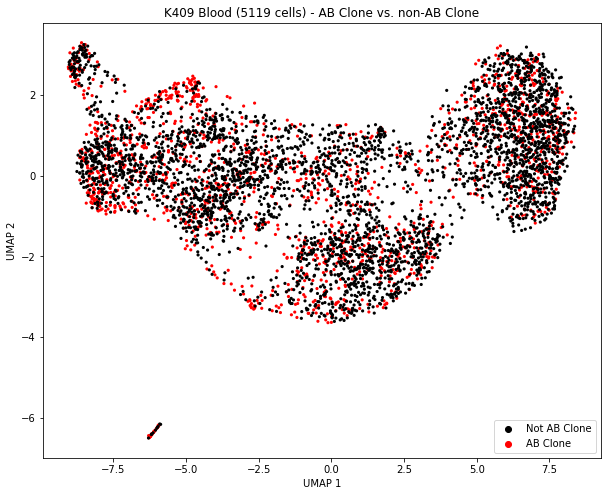

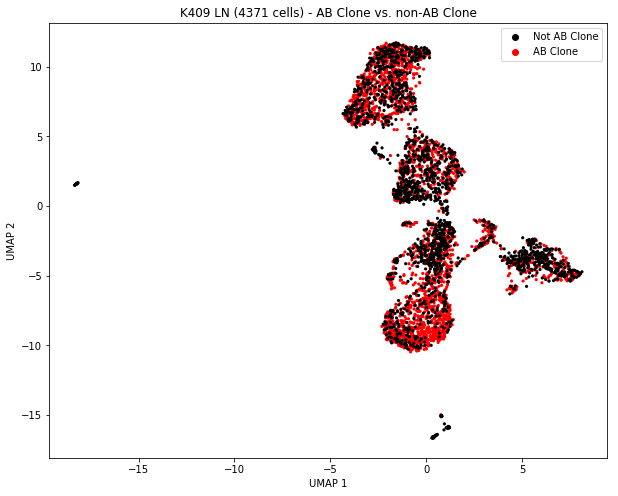

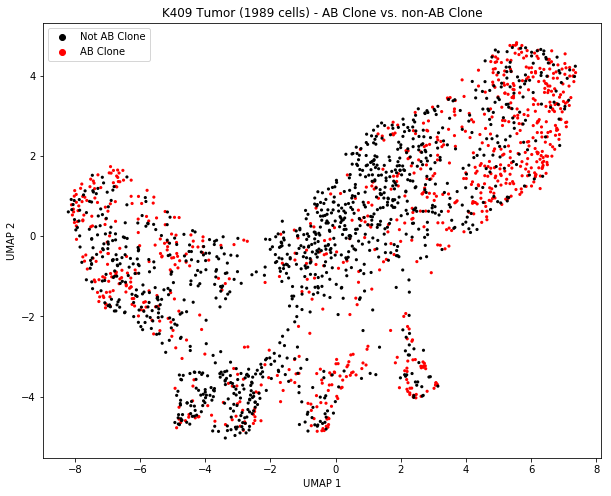

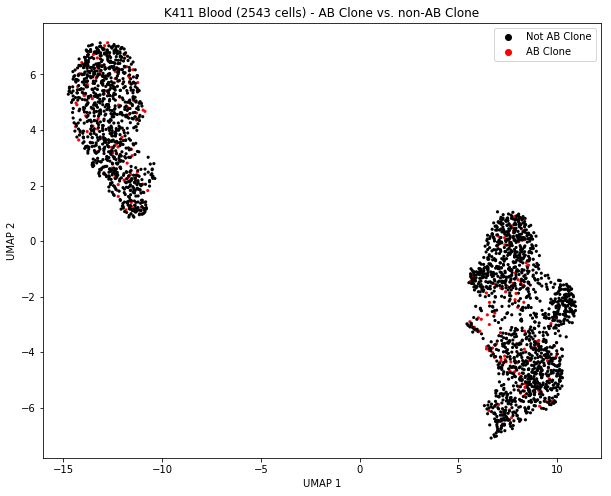

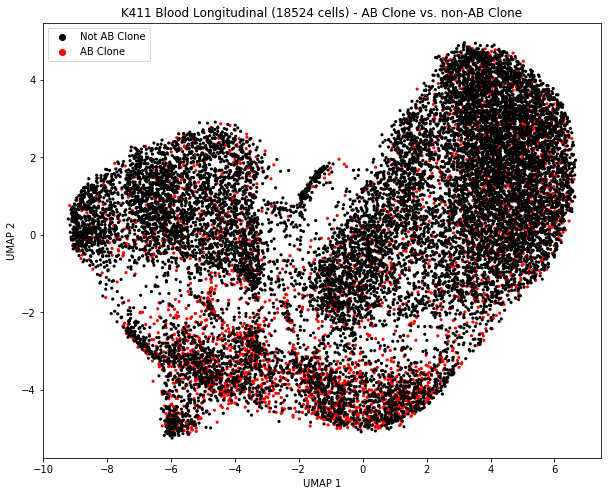

...

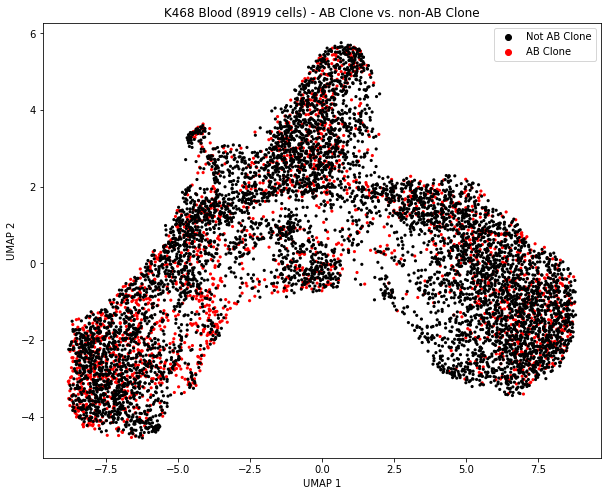

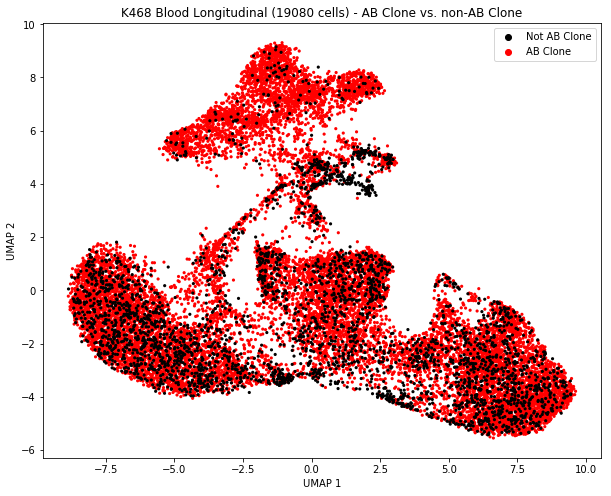

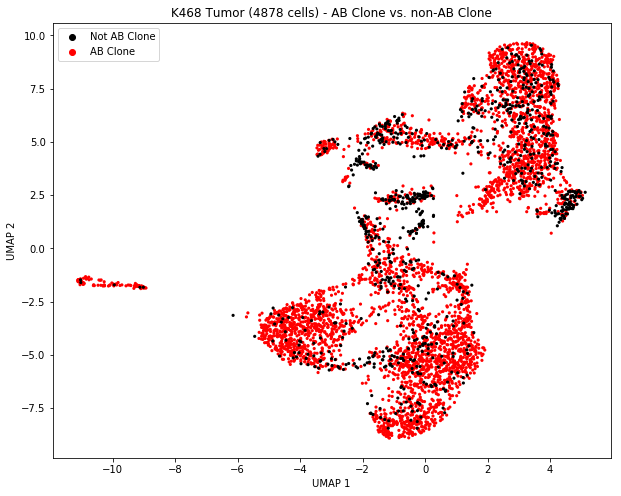

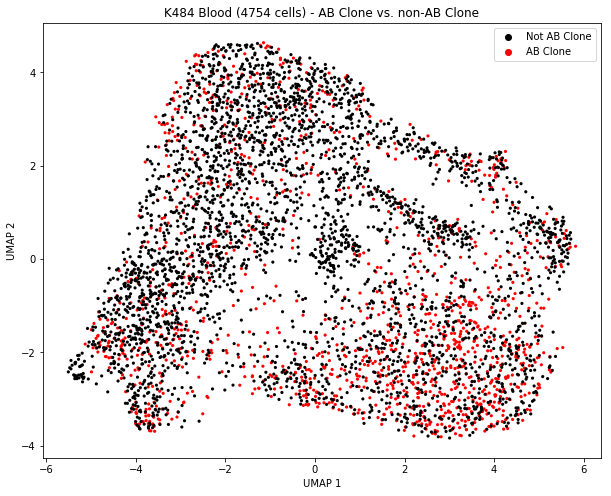

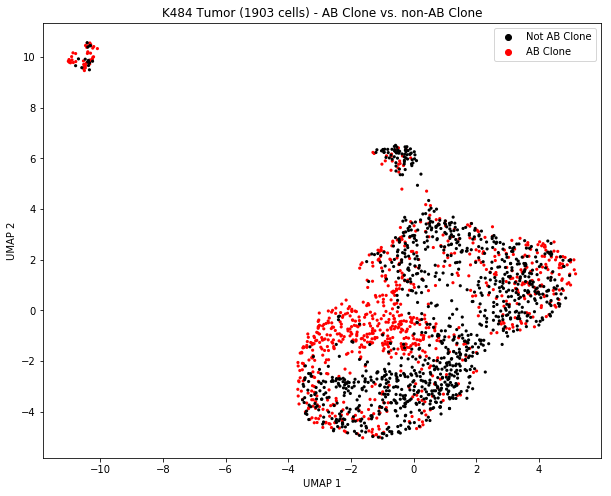

In [35]:
for i,sample in enumerate(samples):
    
    # Make a title
    title = MakeTitle(sample) + ' ({} cells) - AB Clone vs. non-AB Clone'.format(len(Meta[i]))
    
    # Make the plot
    fig, ax = PlotABclone(Meta[i], title)    
    plt.show()

# Make Plots for Matching vs. non-Matching Cells

In [37]:
def Matching_UMAP(df, title):
    """
    Plots the cells from a given sample, and colors them based on whether or not the cell
    is an matching cell.
    """
    
    df = df.copy()
    
    df_AB = AB_Clones(df)
    
    fig, ax = plt.subplots(figsize=(10,8))

    
    sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = df_AB, hue = 'Matching', palette = ['black','red'],
                   hue_order = ['not_matching', 'matching'], ax = ax, s = 10, linewidth = 0)
    
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    ax.set_title(title)
    
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles[1:], labels=labels[1:])
    
    return fig, ax

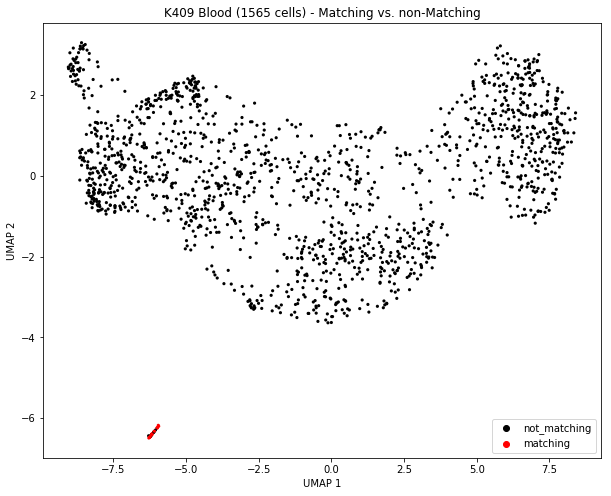

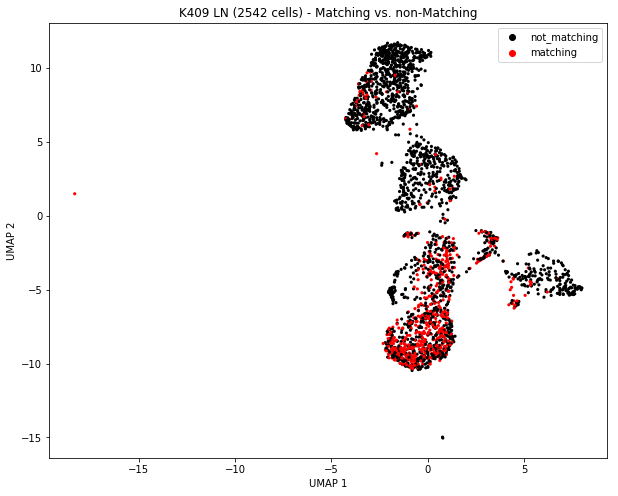

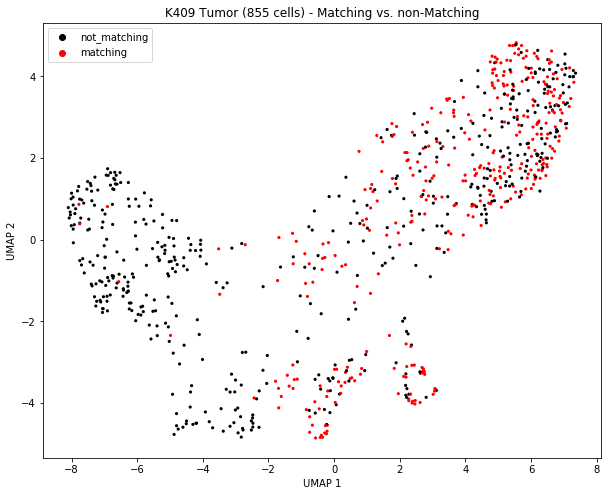

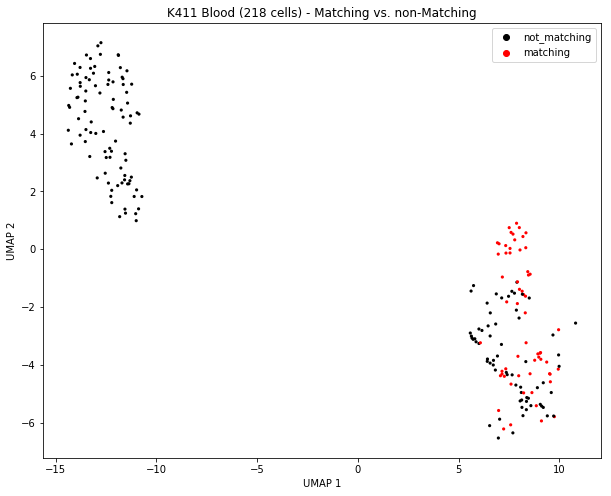

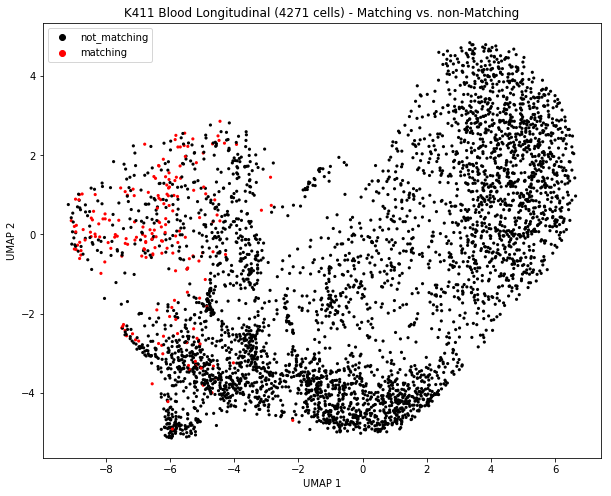

...

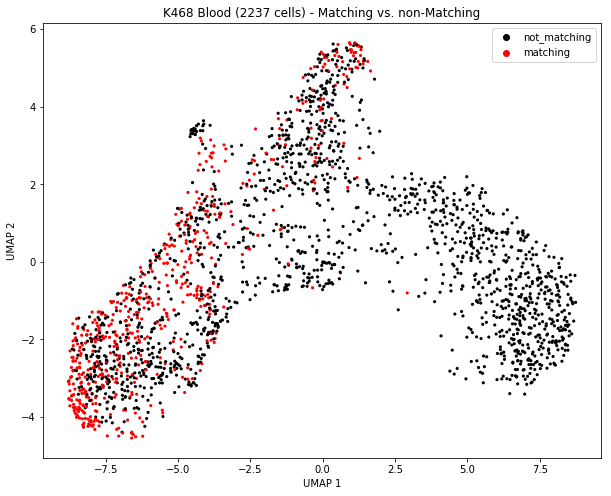

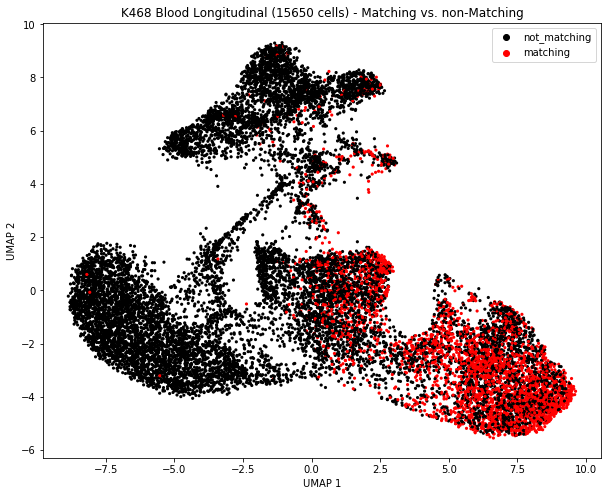

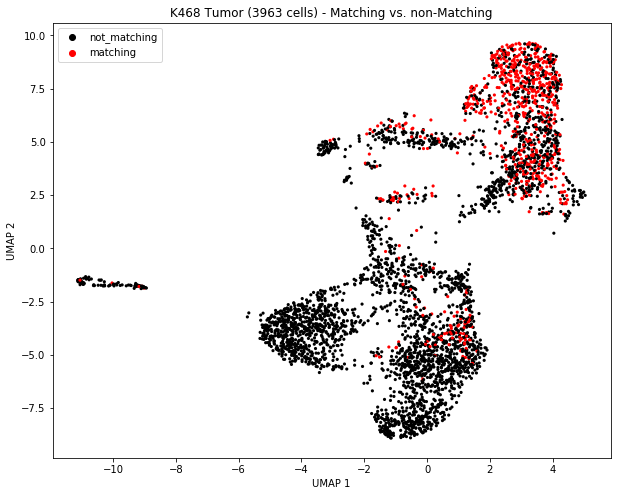

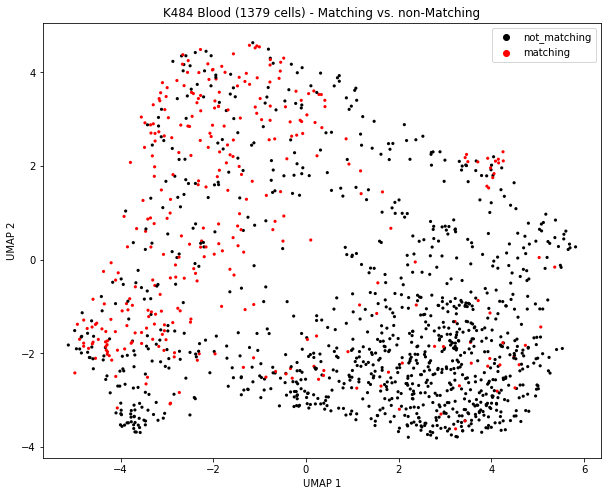

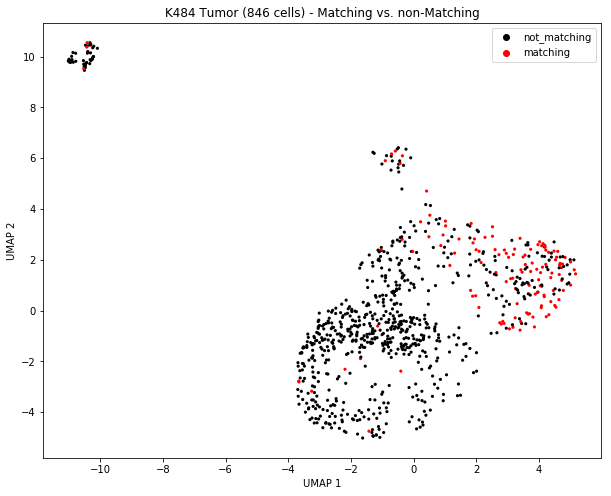

In [38]:
for i,sample in enumerate(samples):
    
    # Make a title
    title = MakeTitle(sample) + ' ({} cells) - Matching vs. non-Matching'.format(len(AB_Clones(Meta[i])))
    
    # Create the plot
    fig, ax = Matching_UMAP(Meta[i], title)
    
    plt.show()

# Pie Charts (PD1+) - By Matching

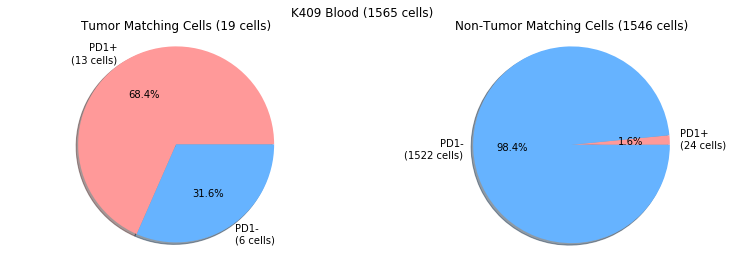

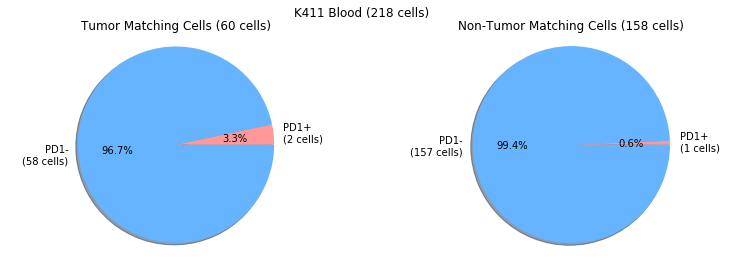

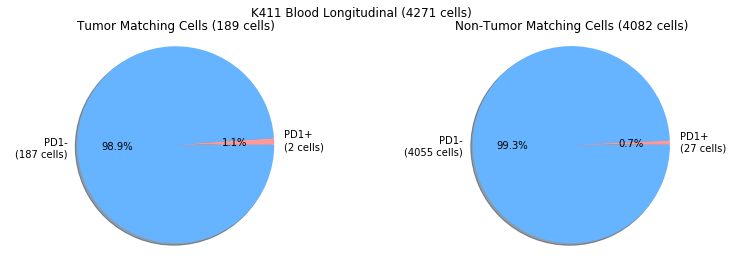

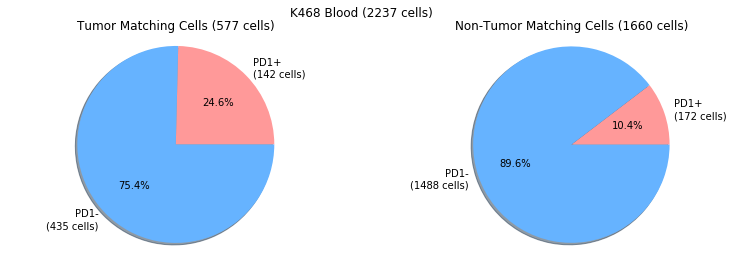

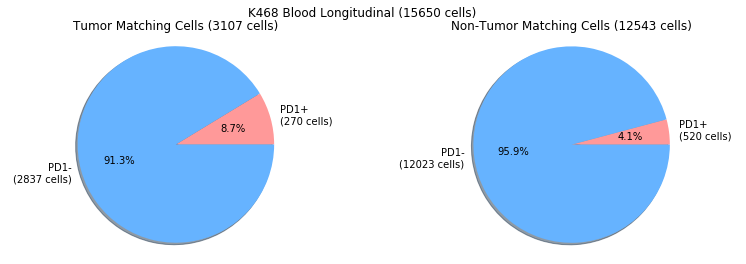

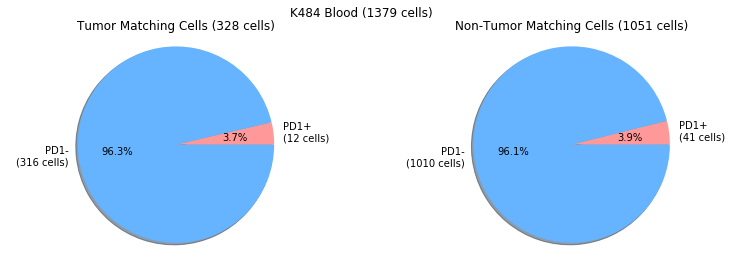

In [39]:
for i,sample in enumerate(samples):
    
    # Run this for only blood samples
    if 'Blood' not in sample:
        continue
    
    # Keep only AB clones
    df = AB_Clones(Meta[i])
    
    # Separate matching and non-matching cells
    TM = df[ df['Matching'] == 'matching' ]
    nTM = df[ df['Matching'] == 'not_matching' ]
    
    # Call gene column for PD1, TM cells
    PD1 = Mtxs[i].loc[TM.index]['PDCD1']
    
    # Number of TM cells that are PD1+
    matching_pd1P = np.count_nonzero(PD1)
    
    # Number of TM cells that are PD1-
    matching_pd1N = len(PD1) - matching_pd1P
    
    # Call gene column for PD1, nTM cells
    PD1 = Mtxs[i].loc[nTM.index]['PDCD1']
    
    # Number of TM cells that are PD1+
    not_matching_pd1P = np.count_nonzero(PD1)
    
    # Number of TM cells that are PD1-
    not_matching_pd1N = len(PD1) - not_matching_pd1P
    
    # Make pie charts
    colors = ['#ff9999','#66b3ff']
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(13, 4))

    # Pie chart
    labels = ['PD1+\n({} cells)'.format(matching_pd1P), 'PD1-\n({} cells)'.format(matching_pd1N)]
    ax1.pie([matching_pd1P,matching_pd1N], labels=labels, shadow=True, autopct='%1.1f%%', colors = colors)
    ax1.axis('equal')
    ax1.set_title('Tumor Matching Cells ({} cells)'.format(len(TM)))

    #colors = ['#99ff99','#66b3ff']
    # Pie chart
    labels = ['PD1+\n({} cells)'.format(not_matching_pd1P), 'PD1-\n({} cells)'.format(not_matching_pd1N)]
    ax2.pie([not_matching_pd1P,not_matching_pd1N], labels=labels, shadow=True, autopct='%1.1f%%',
           colors = colors)
    ax2.axis('equal')
    ax2.set_title('Non-Tumor Matching Cells ({} cells)'.format(len(nTM)))

    fig.suptitle(MakeTitle(sample) + ' ({} cells)\n\n\n\n'.format(len(df)))    

    if sample in ['K409_Blood', 'K411_Blood', 'K468_Blood', 'K484_Blood']:
        plt.savefig('Figures/Fig6A_{}_PD1piechart.pdf'.format(sample))
    plt.show()



# Violin Plots

### Make some functions

In [18]:
def df_to_adata(count_matrix,metadata):
    
    # Convert a count matrix and respective metadata to an Adata object
    # in order to use Scanpy functions
    adata = anndata.AnnData(count_matrix)
    adata.var_names_make_unique()
    
    obsnames = list(metadata.columns)
    
    for name in obsnames:
        adata.obs[name] = list(metadata[name])
        
    return adata

def ViolinObject(meta, mtx):
    
    # Normalize data for AB cells for Violin plots
    meta = AB_Clones(meta)             # Keep only AB clones in metadata
    mtx = mtx.loc[meta.index]          # Keep only AB clones in count matrix
    Adata = df_to_adata(mtx,meta)      # Create an adata object
    
    # Normalize
    sc.pp.normalize_per_cell(Adata, counts_per_cell_after=1e4)
    sc.pp.log1p(Adata)
    sc.pp.scale(Adata)
    
    return Adata

def MakeViolinPlots1(tissue, meta, mtx):
    
    # Create the normalized data
    meta = meta.copy()
    
    if tissue == 'Blood':       
        # Add a label for each cell - either 'TM' or 'nTM' (tumor matching vs. non-tumor matching)
        meta['Tumor Matching'] = ['TM' if match == 'matching' else 'nTM' for match in meta['Matching'] ]
    
    if tissue == 'Tumor':    
        # Add a label for each cell - either 'BlM' or 'nBlM' (blood matching vs. non-blood matching)
        meta['Blood Matching'] = ['BlM' if match == 'matching' else 'nBlM' for match in meta['Matching'] ]
        
    # Create an normalized adata object for the tissue sample
    Adata = ViolinObject(meta, mtx)
    
    return Adata

def MakeViolinPlots2(Adata, genelist, score_name):
    
    ### Run the gene score module
    
    # Extract the metadata
    df = Adata.obs
    
    # Find the intersection of the gene list and the genes in the adata object
    genes_to_plot = set(genelist) & set(Adata.var_names)
    
    # Find gene scores
    sc.tl.score_genes(Adata, genes_to_plot, score_name = score_name)
    
    # Add to metadata object
    df[score_name] = list(Adata.obs[score_name])
    
    return df

def MakeNM(j):
    
    # Helper function for plotting
    
    # If j is odd, subtract 1 to make it even
    if j %2 != 0:
        n = (j - 1)//2
        
    else:
        n = j//2

    m = j % 2
    
    return n,m

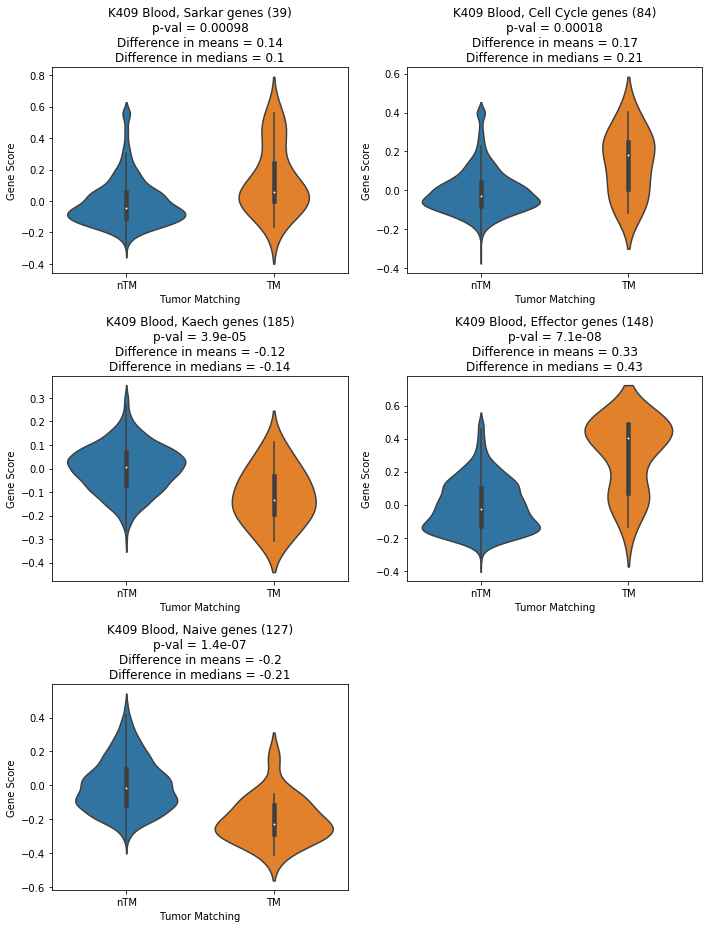

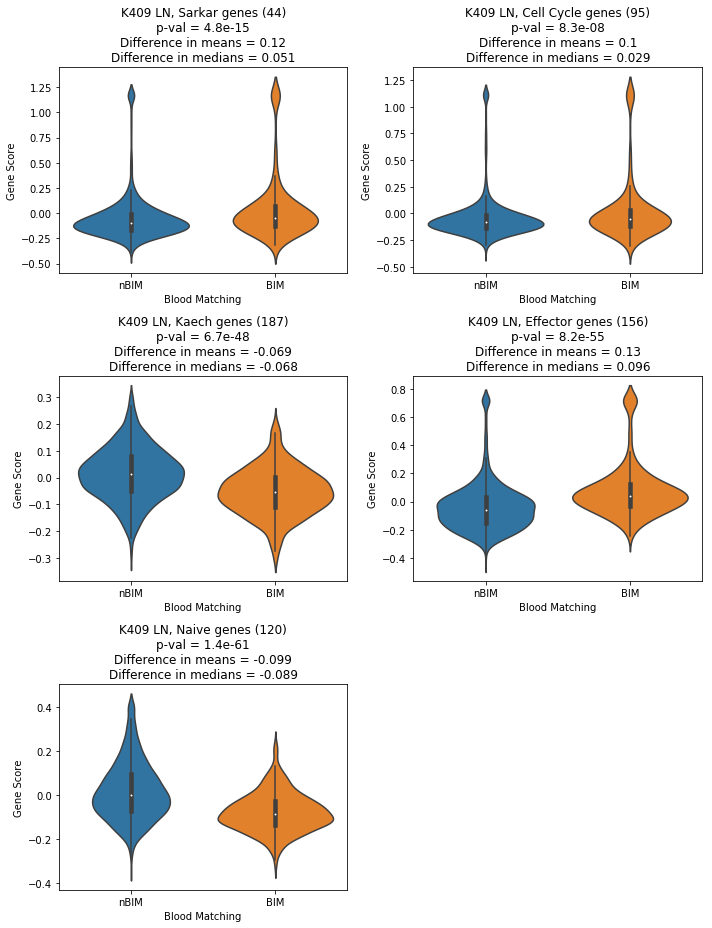

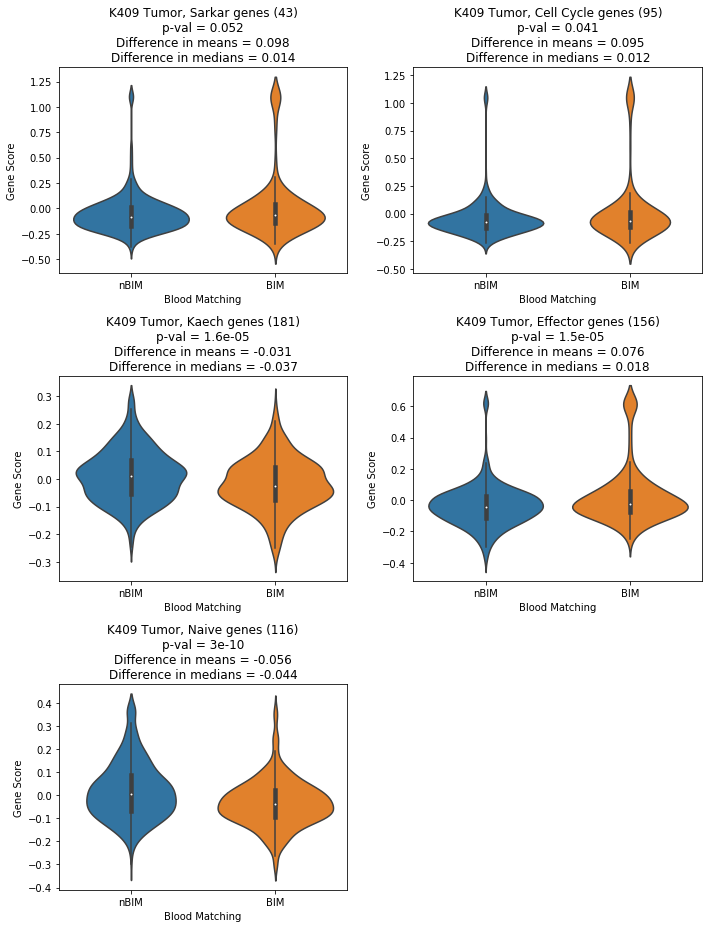

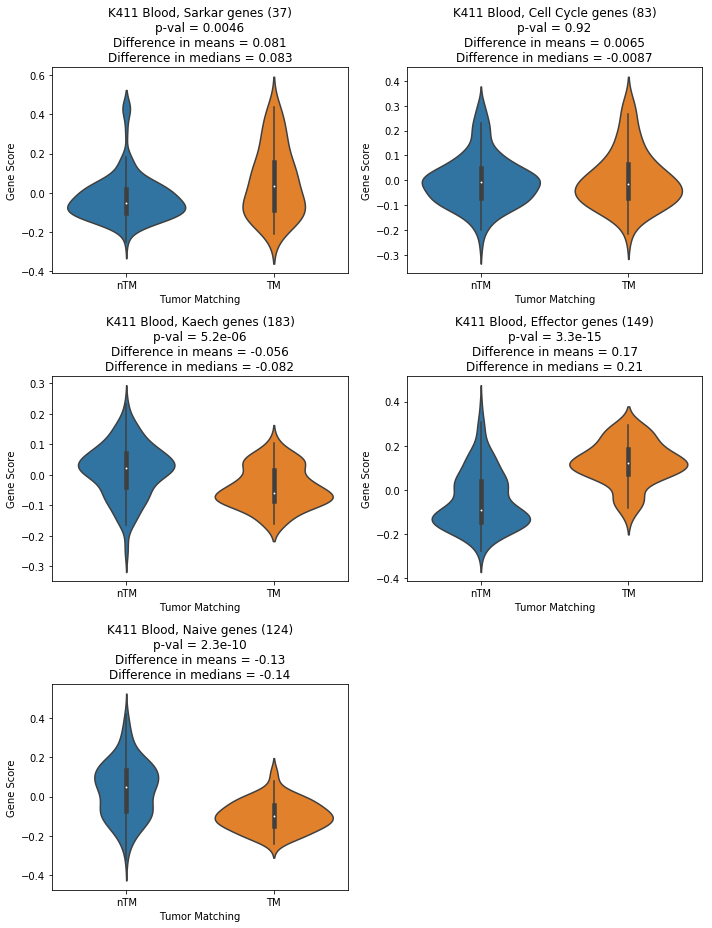

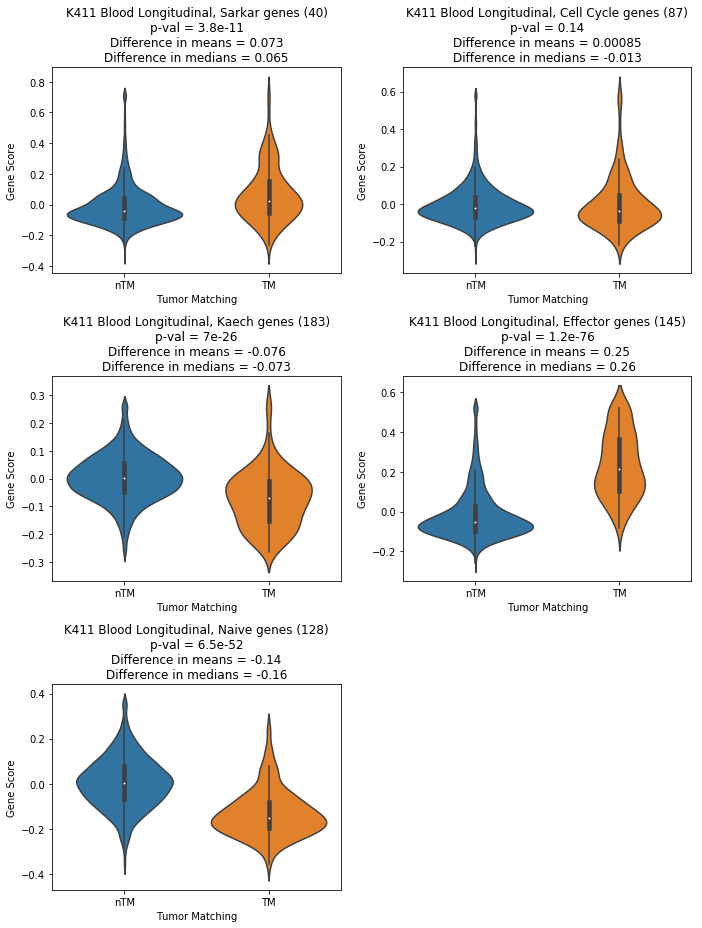

...

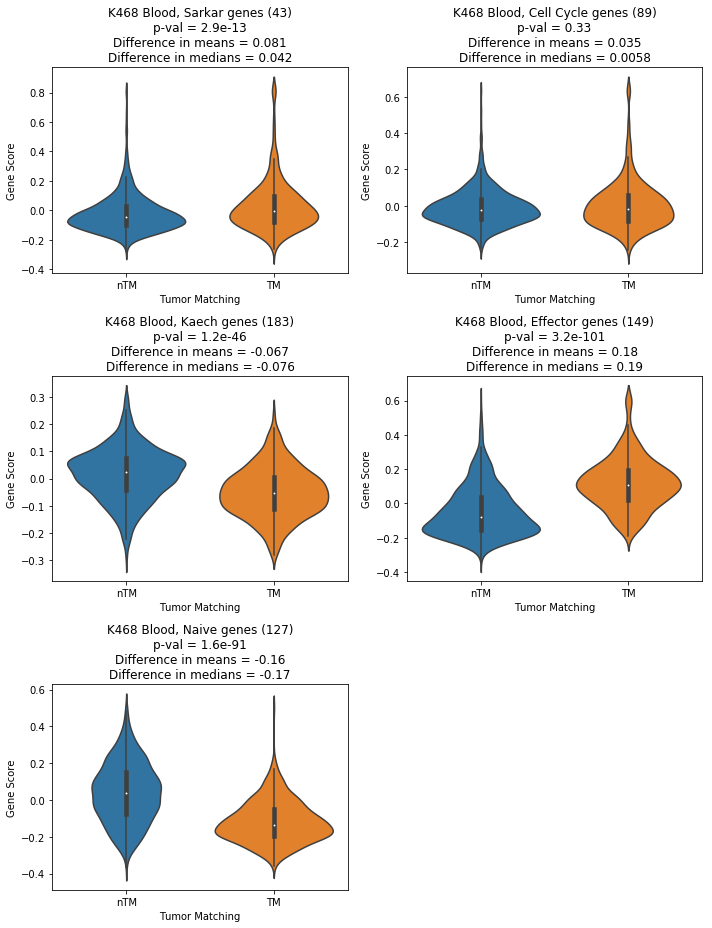

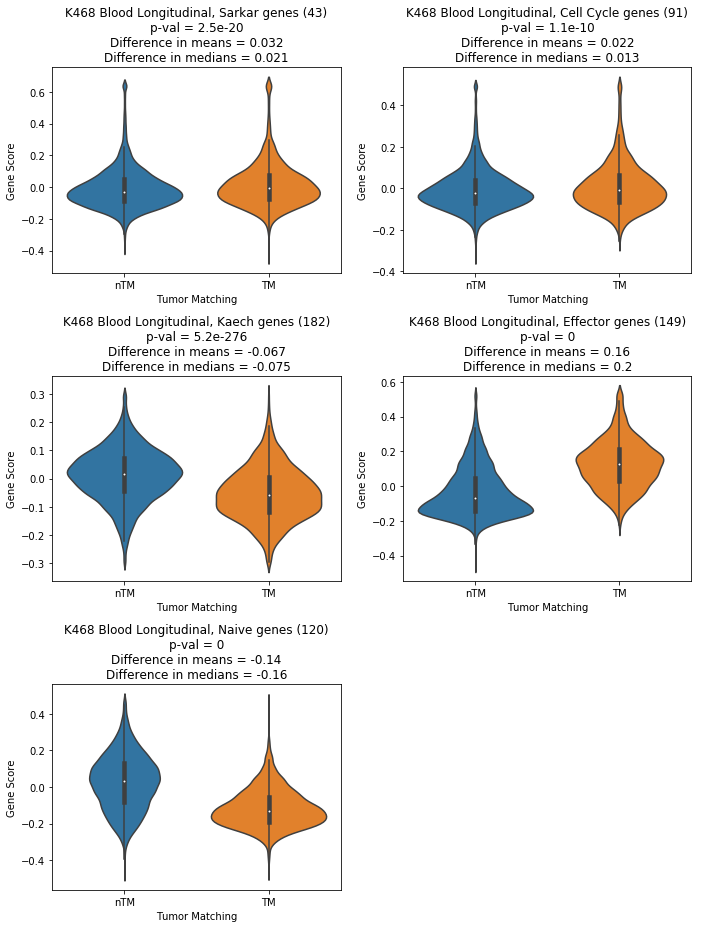

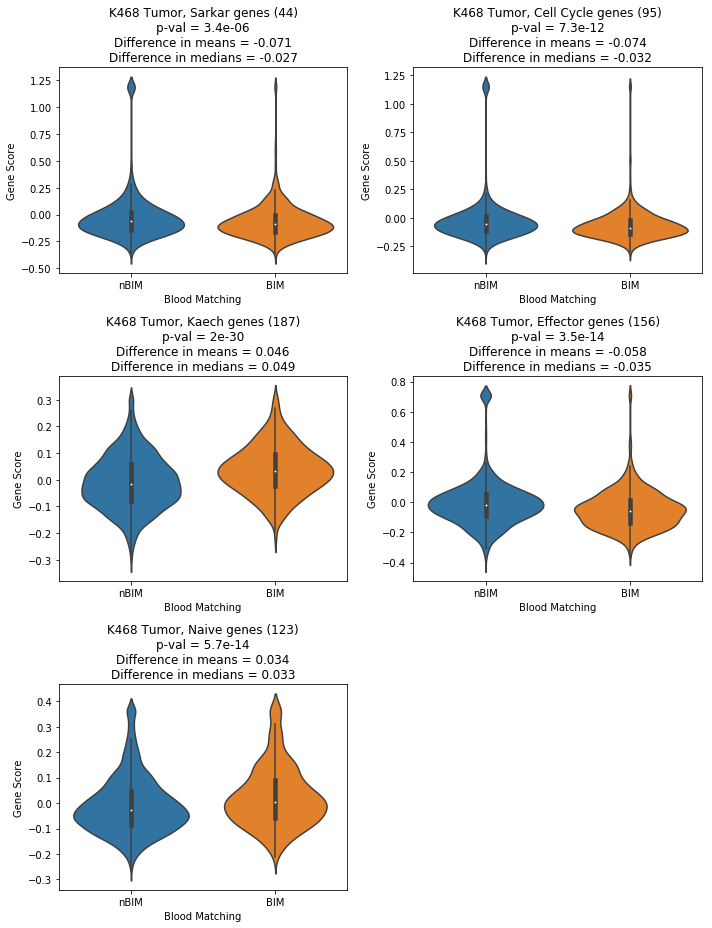

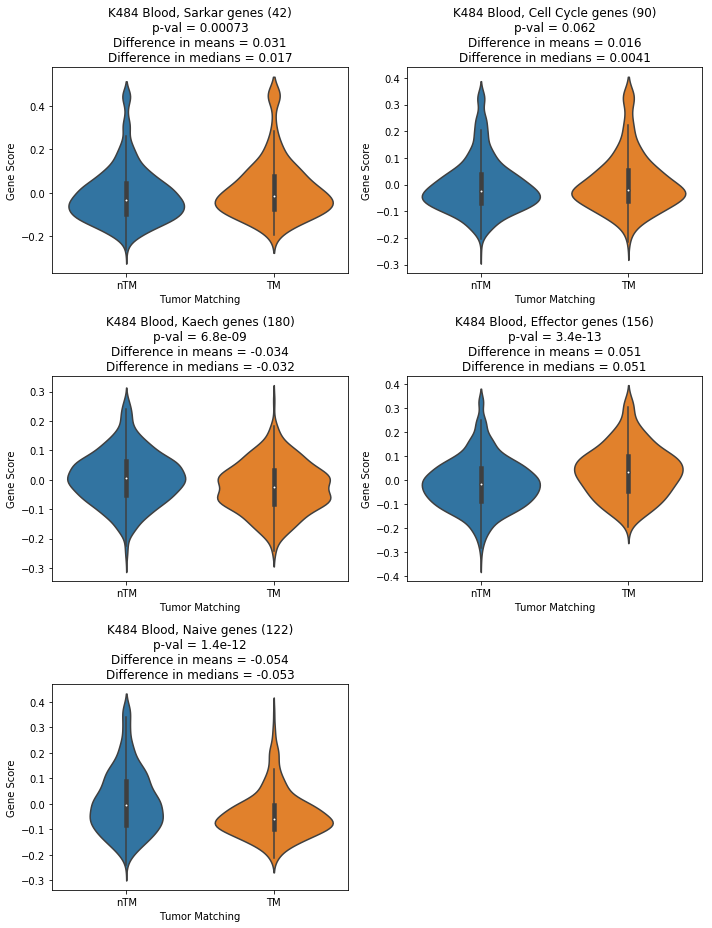

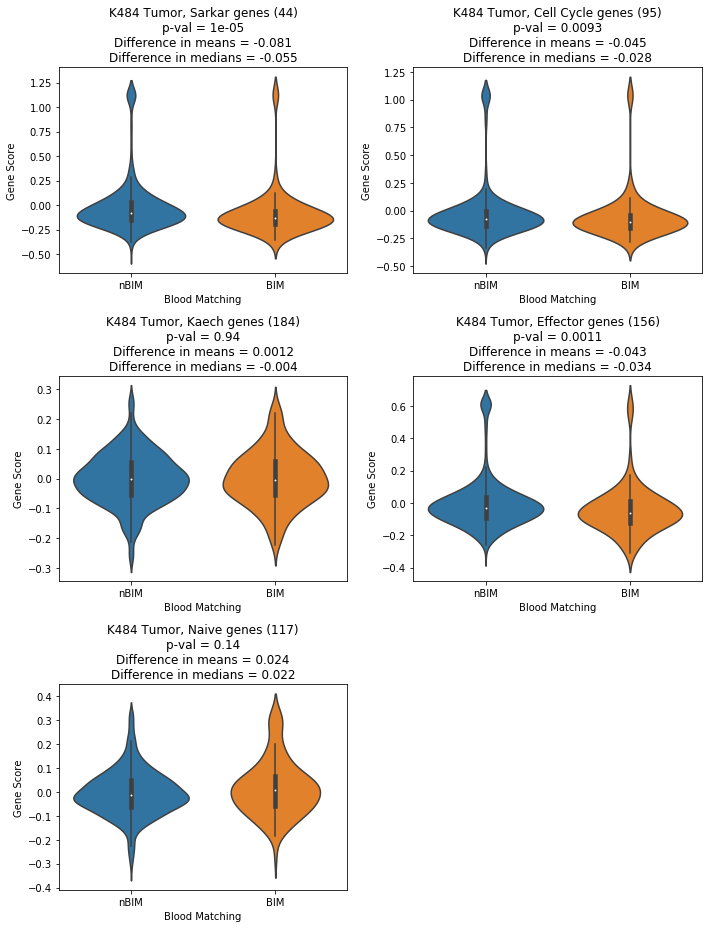

In [43]:
gene_lists = [sarkar_activation, cellcycle, kaech_naive, Eff, Naive]
gene_names = ['Sarkar', 'Cell Cycle', 'Kaech', 'Effector', 'Naive']

for i,sample in enumerate(samples):

    if 'Blood' in sample:
        tissue = 'Blood'
    if 'Tumor' in sample or 'LN' in sample:
        tissue = 'Tumor'
    
    # Create a figure
    fig, axes = plt.subplots(nrows = 3, ncols = 2, figsize = (10,13))
    fig.delaxes(axes[-1,-1])
    
    Adata = MakeViolinPlots1(tissue, Meta[i], Mtxs[i])
    
    # For each gene list,
    for j,genelist in enumerate(gene_lists):
        score_name = gene_names[j]
        
        df = MakeViolinPlots2(Adata, genelist, score_name)
        
        # Find out how many genes are in comparison
        n_genes = len(set(genelist) & set(Adata.var_names))
        
        # Create two lists to calculate statistics
        if tissue == 'Blood':
            M = df[ df['Tumor Matching'] == 'TM' ]
            nM = df[ df['Tumor Matching'] == 'nTM' ]
            Matching = 'Tumor Matching'
            order = ['nTM','TM']
        else:
            M = df[ df['Blood Matching'] == 'BlM' ]
            nM = df[ df['Blood Matching'] == 'nBlM' ] 
            Matching = 'Blood Matching'
            order = ['nBlM','BlM']

        # p-value and differences
        stat,pval = scipy.stats.ranksums(M[score_name], nM[score_name])
        diff_mean = np.mean(M[score_name]) - np.mean(nM[score_name])
        diff_median = np.median(M[score_name]) - np.median(nM[score_name])
        
        # Fit the gene scores to a normal distribution
        score_list = list(df[score_name])
        mu, SD = scipy.stats.norm.fit(score_list)

        # Cap the scores
        # Define a threshold
        thresh = 3
        thresh1 = mu + thresh*SD
        thresh2 = mu - thresh*SD

        # Else, cap the data
        for e,ele in enumerate(score_list):
            if ele >= thresh1:
                score_list[e] = thresh1
            if ele <= thresh2:
                score_list[e] = thresh2
                
        df[score_name] = score_list

        # Determine the value of n,m from the value of j
        n,m = MakeNM(j)

        sns.violinplot(x = Matching, y = score_name, data = df, ax = axes[n,m], order = order)

        title1 = MakeTitle(sample) + ', {} genes ({})\n'.format(score_name, n_genes)
        title2 = 'p-val = {:.2g}\n'.format(pval)
        title3 = 'Difference in means = {:.2g}\n'.format(diff_mean)
        title4 = 'Difference in medians = {:.2g}'.format(diff_median)
        title = title1 + title2 + title3 + title4

        axes[n,m].set_title(title)
        axes[n,m].set_ylabel('Gene Score')
        
    plt.tight_layout()
    
    # Save certain plots for original blood samples
    if sample in ['K409_Blood', 'K411_Blood', 'K468_Blood', 'K484_Blood']:
        
        # Save Activation/Effector plot
        extent = axes[1,1].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
        fig.savefig('Figures/Fig4D_' + sample + '_Effector_ViolinPlot.pdf',
                    bbox_inches=extent.expanded(1.35, 1.55))
        
        # Save Naive plot
        extent = axes[2,0].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
        fig.savefig('Figures/Fig4E_' + sample + '_Naive_ViolinPlot.pdf',
                    bbox_inches=extent.expanded(1.35, 1.55))
    
    # Save certain plots for longitudinal blood samples
    if sample in ['K411_Blood_Longitudinal', 'K468_Blood_Longitudinal']:
        extent = axes[1,1].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
        fig.savefig('Figures/SuppFig3_' + sample + '_Effector_ViolinPlot.pdf',
                    bbox_inches=extent.expanded(1.35, 1.55))
        
        extent = axes[2,0].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
        fig.savefig('Figures/SuppFig3_' + sample + '_Naive_ViolinPlot.pdf',
                    bbox_inches=extent.expanded(1.35, 1.55))
    
    plt.show()


### Run using GLIPH/iSMART Analysis

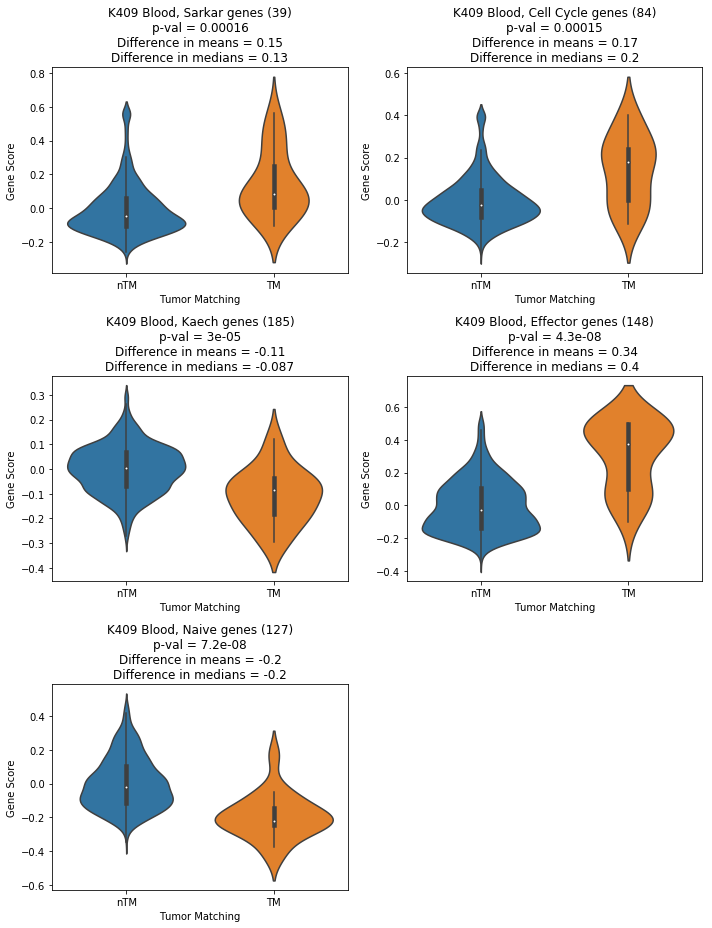

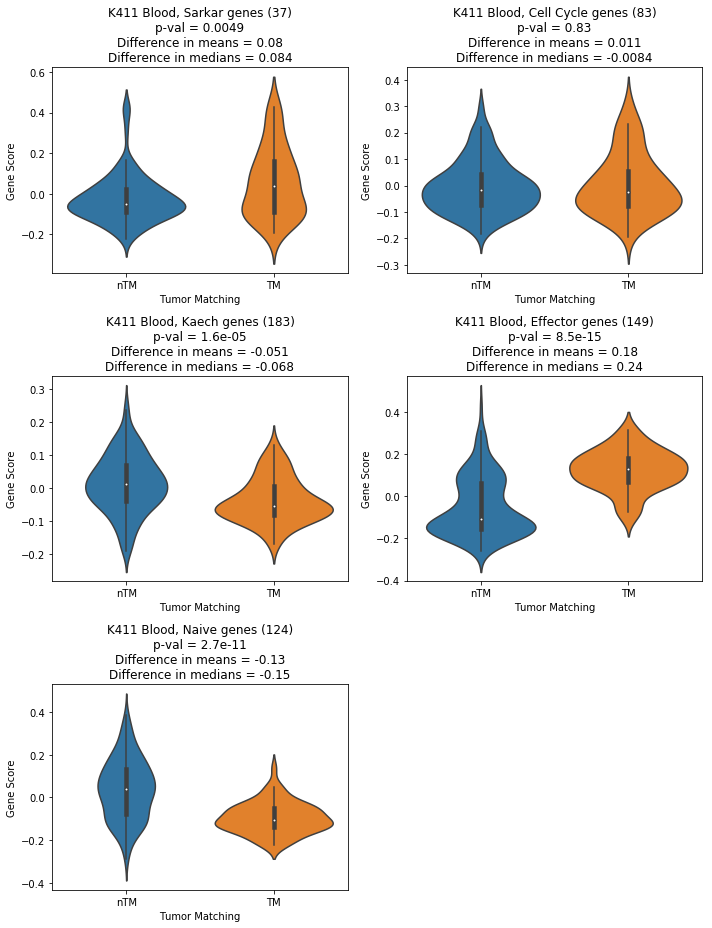

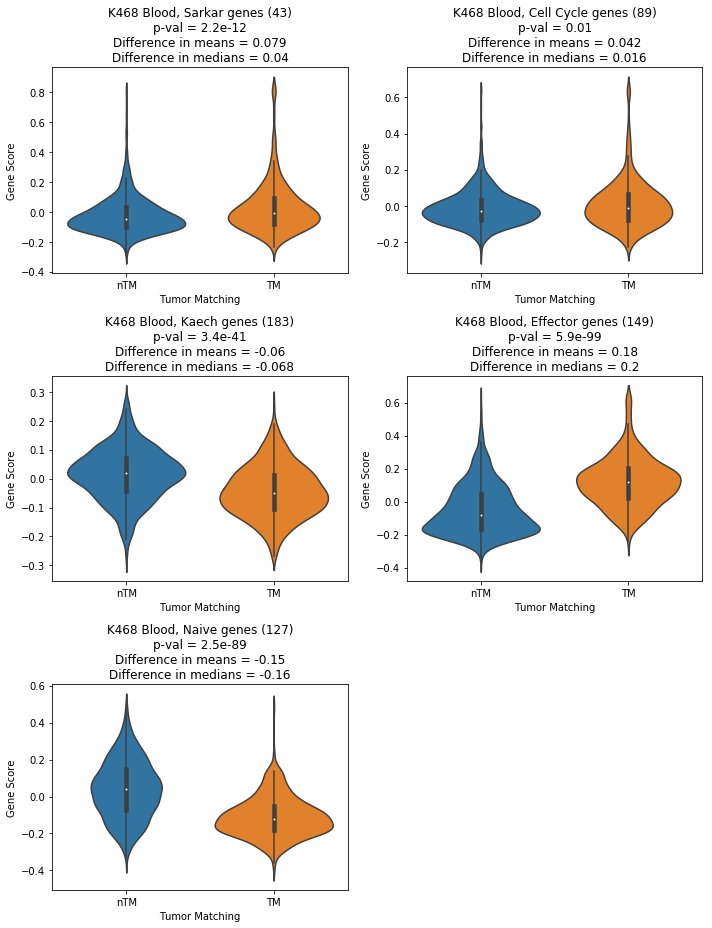

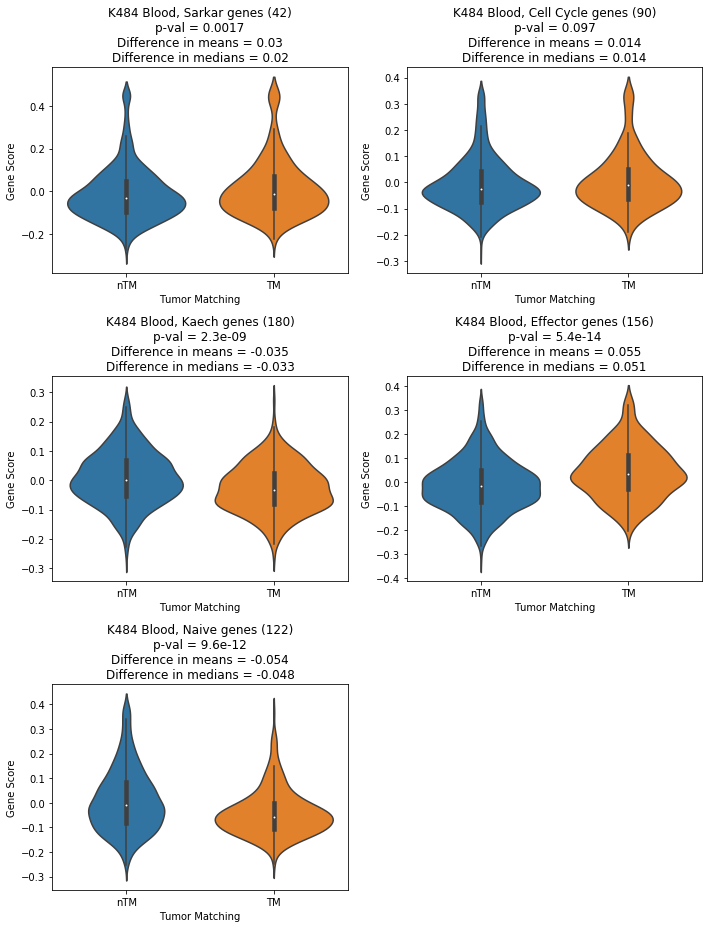

In [19]:
gene_lists = [sarkar_activation, cellcycle, kaech_naive, Eff, Naive]
gene_names = ['Sarkar', 'Cell Cycle', 'Kaech', 'Effector', 'Naive']

gliph_path = '/Users/oshahid/Desktop/RawData/Blood_Tumor/ProcessedData/TCR_metadata/GLIPHiSMART/'

for sample in ['K409_Blood', 'K411_Blood', 'K468_Blood', 'K484_Blood']:
    
    # Get the index number
    idx = samples.index(sample)
    
    # Load the GLIPH results
    gliph = pd.read_csv(gliph_path + sample + '_GLIPHiSMART.csv', index_col = 0)
    gliph.index = gliph.X
    gliph['TM'].replace(1, 'matching', inplace = True)
    gliph['Matching'] = gliph['TM'].replace(2, 'not_matching')
    
    # Subset the count matrix and metadata
    mtx = Mtxs[idx].loc[gliph.index]
    meta = Meta[idx].loc[gliph.index]
    
    # Run the pipeline
    tissue = 'Blood'
    
    # Create a figure
    fig, axes = plt.subplots(nrows = 3, ncols = 2, figsize = (10,13))
    fig.delaxes(axes[-1,-1])
    
    Adata = MakeViolinPlots1(tissue, meta, mtx)
    
    # For each gene list,
    for j,genelist in enumerate(gene_lists):
        score_name = gene_names[j]
        
        df = MakeViolinPlots2(Adata, genelist, score_name)
        
        # Find out how many genes are in comparison
        n_genes = len(set(genelist) & set(Adata.var_names))
        
        # Create two lists to calculate statistics
        if tissue == 'Blood':
            M = df[ df['Tumor Matching'] == 'TM' ]
            nM = df[ df['Tumor Matching'] == 'nTM' ]
            Matching = 'Tumor Matching'
            order = ['nTM','TM']
        else:
            M = df[ df['Blood Matching'] == 'BlM' ]
            nM = df[ df['Blood Matching'] == 'nBlM' ] 
            Matching = 'Blood Matching'
            order = ['nBlM','BlM']

        # p-value and differences
        stat,pval = scipy.stats.ranksums(M[score_name], nM[score_name])
        diff_mean = np.mean(M[score_name]) - np.mean(nM[score_name])
        diff_median = np.median(M[score_name]) - np.median(nM[score_name])
        
        # Fit the gene scores to a normal distribution
        score_list = list(df[score_name])
        mu, SD = scipy.stats.norm.fit(score_list)

        # Cap the scores
        # Define a threshold
        thresh = 3
        thresh1 = mu + thresh*SD
        thresh2 = mu - thresh*SD

        # Else, cap the data
        for e,ele in enumerate(score_list):
            if ele >= thresh1:
                score_list[e] = thresh1
            if ele <= thresh2:
                score_list[e] = thresh2
                
        df[score_name] = score_list

        # Determine the value of n,m from the value of j
        n,m = MakeNM(j)

        sns.violinplot(x = Matching, y = score_name, data = df, ax = axes[n,m], order = order)

        title1 = MakeTitle(sample) + ', {} genes ({})\n'.format(score_name, n_genes)
        title2 = 'p-val = {:.2g}\n'.format(pval)
        title3 = 'Difference in means = {:.2g}\n'.format(diff_mean)
        title4 = 'Difference in medians = {:.2g}'.format(diff_median)
        title = title1 + title2 + title3 + title4

        axes[n,m].set_title(title)
        axes[n,m].set_ylabel('Gene Score')
        
    plt.tight_layout()
    
        
    # Save Activation/Effector plot
    extent = axes[1,1].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    fig.savefig('Figures/SuppFig5B_' + sample + '_Effector_ViolinPlot.pdf',
                bbox_inches=extent.expanded(1.35, 1.55))

    # Save Naive plot
    extent = axes[2,0].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    fig.savefig('Figures/SuppFig5C_' + sample + '_Naive_ViolinPlot.pdf',
                bbox_inches=extent.expanded(1.35, 1.55))

    plt.show()

# Signature Analysis (Two tissues)

In [44]:
def LoadSF(SF, gene_name):
    df = SF[gene_name]
    df = df[~df.isna()]
    df = list(df)
    return df

SF = pd.read_excel("GeneLists/SadeFeldman_TableS4.xlsx", sheet_name = "Gene markers-Fig4A-B", header=1)
SF_CD8 = [0] * 6
GeneNames = ['GeneName']+['GeneName.'+str(i) for i in range(1,6)]

for i,gene_name in enumerate(GeneNames):
    SF_CD8[i] = LoadSF(SF, gene_name)

In [45]:
def SigAl(sample1, sample2, t1_mtx, t1_meta, t2_mtx, t2_meta, gene_list, score_name, scale_sd=False,
                matching_only=False):
    
    t1_meta = AB_Clones(t1_meta)
    t2_meta = AB_Clones(t2_meta)
    
    # Keep only AB clones in count matrices
    t1_mtx = t1_mtx.loc[t1_meta.index]
    t2_mtx = t2_mtx.loc[t2_meta.index]
    
    # Add the tissue type to each metadata object
    t1_meta['Tissue'] = sample1
    t2_meta['Tissue'] = sample2
    
    # Convert to adata objects
    t1_adata = df_to_adata(t1_mtx,t1_meta)
    t2_adata = df_to_adata(t2_mtx,t2_meta)
    
    # Combine into a single Adata structure
    Adata = t1_adata.concatenate(t2_adata, join = 'outer')
    Adata.X = np.nan_to_num(Adata.X)
    
    # Normaliziation
    sc.pp.normalize_total(Adata, target_sum = 1e4)
    sc.pp.log1p(Adata)
    
    # If scale to unit variance AND zero mean:
    if scale_sd:
        sc.pp.scale(Adata)
        
    else:   
        # If only zero mean:
        Adata.X = Adata.X - np.mean(Adata.X, axis = 0)
    
    
    # Calculate gene score    
    gene_list = set(gene_list) & set(Adata.var_names)
    n_genes = len(gene_list)
    sc.tl.score_genes(Adata, gene_list, score_name = score_name)
    
    # Extract metadata
    df = Adata.obs
    
    
    # Extract metadata
    t1_meta = df[ df['Tissue'] == sample1 ]
    t2_meta = df[ df['Tissue'] == sample2 ]
    
    if matching_only:
        # Keep only matching clones
        t1_meta = t1_meta[ t1_meta['Matching'] == 'matching' ]
        t2_meta = t2_meta[ t2_meta['Matching'] == 'matching' ]
        
    else:
        pass
    
    UniqueTCRs = list(set(t1_meta['TCR']) & set(t2_meta['TCR']))
    UniqueTCRs = sorted(UniqueTCRs)
    
    t1_dict = {}
    t2_dict = {}  
    
    # For each TCR, extract the set of cells with that TCR and calculate the mean gene score.
    # Add to the respective dictionary
    for TCR in UniqueTCRs:
        data = t1_meta[ t1_meta['TCR'] == TCR ].copy()
        t1_dict[TCR] = np.mean(data[score_name])

        data = t2_meta[ t2_meta['TCR'] == TCR ].copy()
        t2_dict[TCR] = np.mean(data[score_name])  
        
    col_names = ['TCR', score_name, 'Tissue']

    # DataFrame for the t1 cells
    t1_df = pd.DataFrame(columns = col_names)
    t1_df['TCR'] = list(t1_dict.keys())
    t1_df[score_name] = list(t1_dict.values())
    t1_df['Tissue'] = sample1

    # DataFrame for the t2 cells
    t2_df = pd.DataFrame(columns = col_names)
    t2_df['TCR'] = list(t2_dict.keys())
    t2_df[score_name] = list(t2_dict.values())
    t2_df['Tissue'] = sample2

    t1_df.index = ['TCR_'+str(t) for t in range(len(t1_df))]
    t2_df.index = ['TCR_'+str(t) for t in range(len(t2_df))]
    
    
    # Calculate p-value       
    # Calculate the Wilcoxon signed-rank test.
    # The Wilcoxon signed-rank test tests the null hypothesis that two related
    # paired samples come from the same distribution. In particular, it tests
    # whether the distribution of the differences x - y is symmetric about zero.
    # It is a non-parametric version of the paired T-test.

    stat,pval = scipy.stats.wilcoxon(t1_df[score_name],t2_df[score_name])

    # Calculate difference in means and medians
    diff_mean = np.mean(t2_df[score_name]) - np.mean(t1_df[score_name])
    diff_median = np.median(t2_df[score_name]) - np.median(t1_df[score_name])

    # Concatenate the dataframes for easy plotting with the Seaborn package (loaded as 'sns')
    Sample = pd.concat([t1_df,t2_df])
    
    # Make a title
    title1 = "{} for {} ({})".format(score_name,sample1.split("_")[0],n_genes)
    title2 = "p-value = %.2g" % pval
    title3 = "Difference in Means = %.2g" % diff_mean
    title4 = "Difference in Medians = %.2g" % diff_median
    title = title1 + "\n" + title2 + "\n" + title3 + "\n" + title4
    
    return Sample,title

In [46]:
# Create a list of the comparisons to run for the subsequent plots

comparisons = []
comparison_names = []

for i,sample in enumerate(sample_objects):
    
    if sample == K409:
        comparisons.append((K409.blood_meta,K409.blood_mtx,K409.ln_tumor_meta,K409.ln_tumor_mtx))
    else:
        comparisons.append((sample.blood_meta,sample.blood_mtx,sample.tumor_meta,sample.tumor_mtx))
    comparison_names.append(sample.sample + ' Blood vs Tumor')
        
    if sample.long:
        comparisons.append((sample.blood_meta,sample.blood_mtx,sample.long_meta,sample.long_mtx))
        comparison_names.append(sample.sample + ' Blood vs Blood Long')

In [47]:
comparison_names

['K409 Blood vs Tumor',
 'K411 Blood vs Tumor',
 'K411 Blood vs Blood Long',
 'K468 Blood vs Tumor',
 'K468 Blood vs Blood Long',
 'K484 Blood vs Tumor']

### Do comparisons for Sade-Feldman Genes


K409 Blood vs Tumor



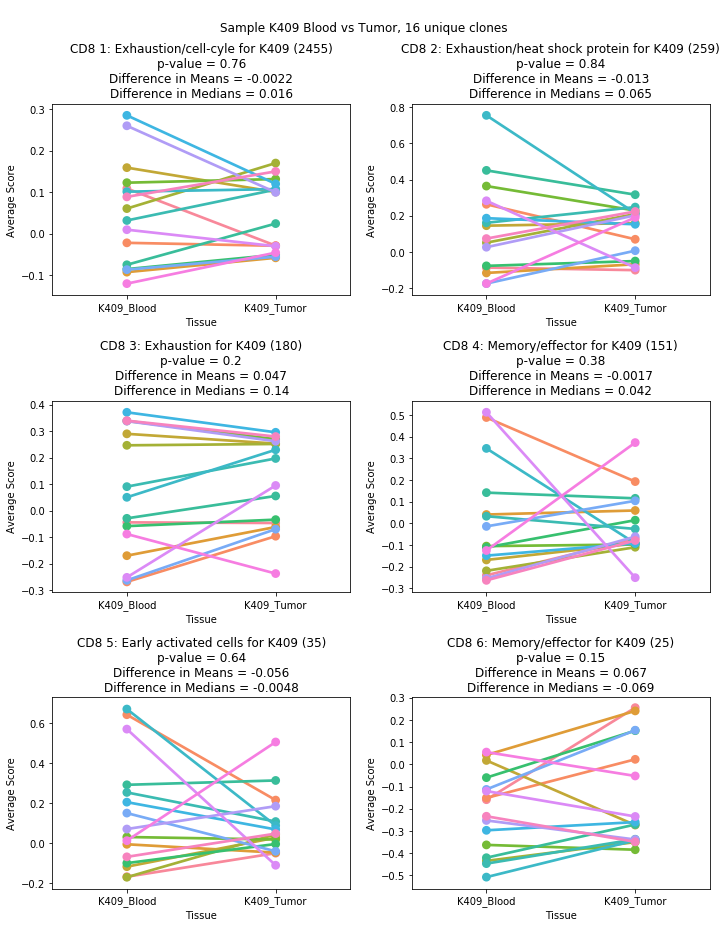


K411 Blood vs Tumor



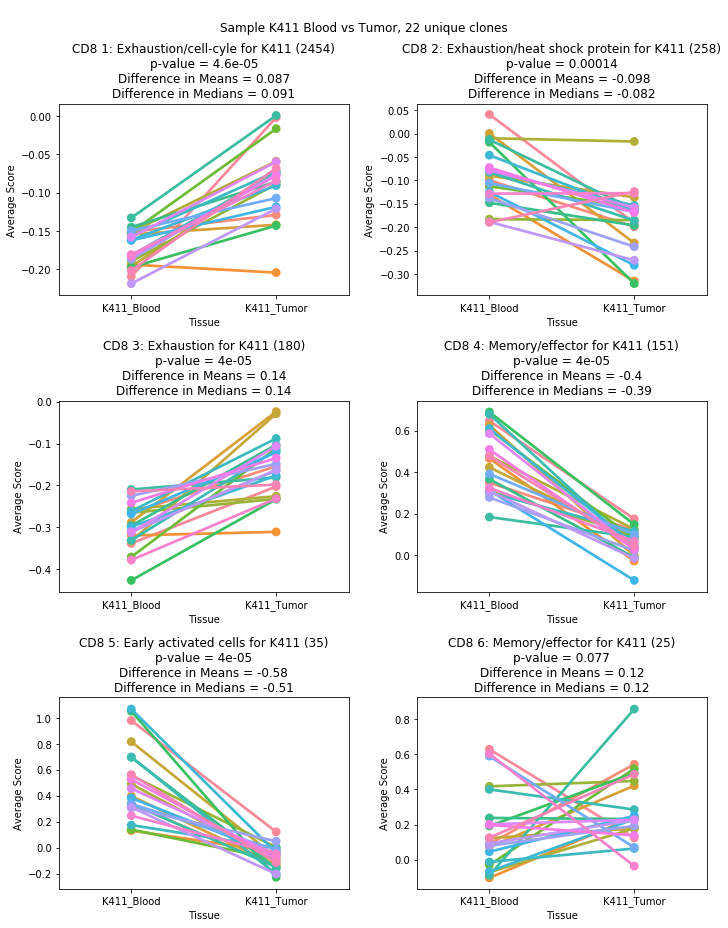


K411 Blood vs Blood Long



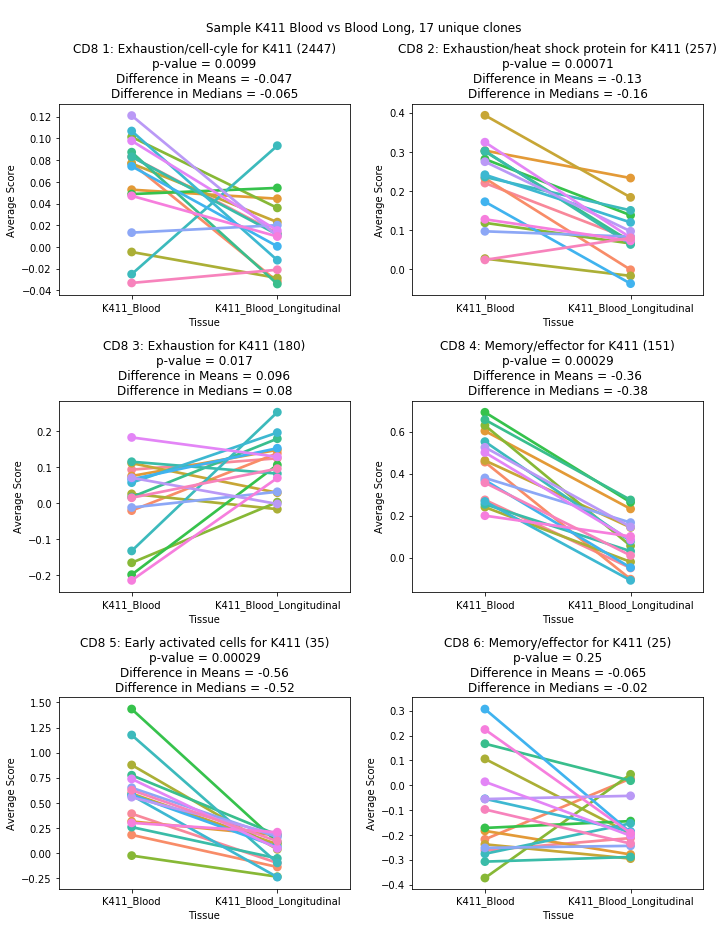


K468 Blood vs Tumor



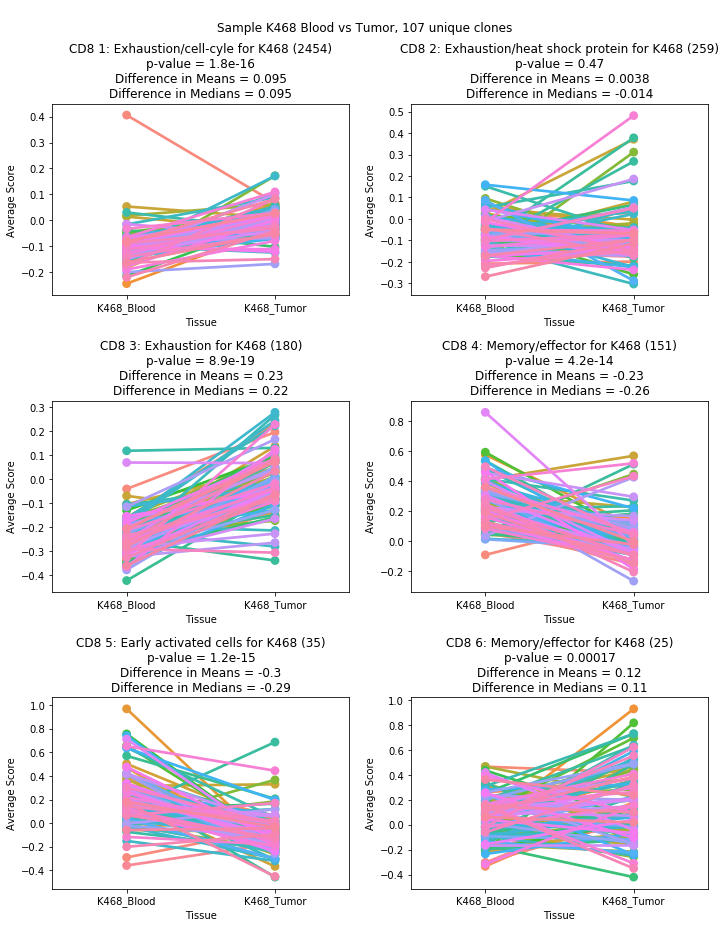


K468 Blood vs Blood Long



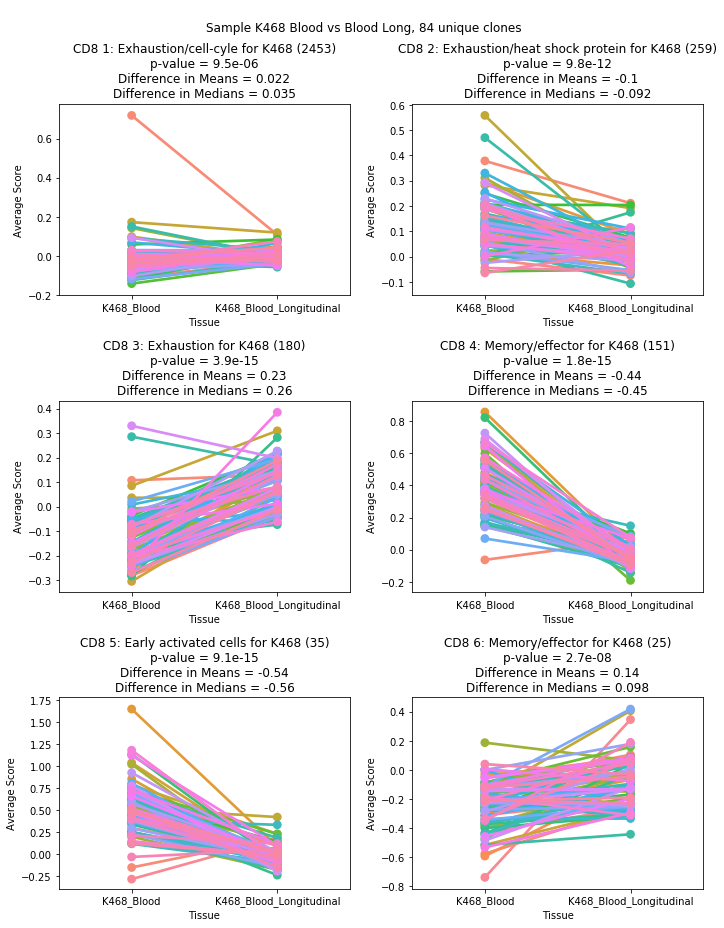


K484 Blood vs Tumor



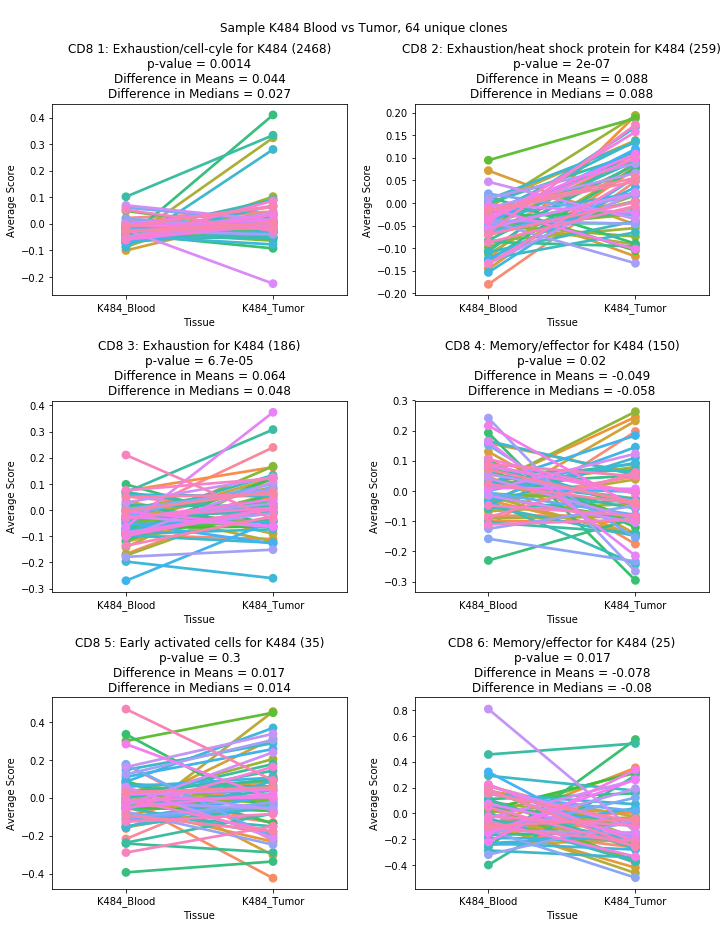

In [52]:
genes_to_use = SF_CD8
names_to_use = ['CD8 1: Exhaustion/cell-cyle', 'CD8 2: Exhaustion/heat shock protein',
                      'CD8 3: Exhaustion', 'CD8 4: Memory/effector',
                      'CD8 5: Early activated cells', 'CD8 6: Memory/effector']

for i,comparison in enumerate(comparisons):

    t1_meta = comparison[0]
    t1_mtx  = comparison[1]
    t2_meta = comparison[2]
    t2_mtx  = comparison[3]
    
    sample1 = list(t1_meta['Sample'])[0]
    sample2 = list(t2_meta['Sample'])[0]
    
    if 'Long' in comparison_names[i]:
        matching_only = True
    else:
        matching_only = False


    
    print("\n{}\n".format(comparison_names[i]))
    
    fig, axes = plt.subplots(nrows=3, ncols=2, constrained_layout=True, figsize=(10,13))

    for j, (genelist,score_name) in enumerate(zip(genes_to_use,names_to_use)):

        Sample,title = SigAl(sample1, sample2, t1_mtx, t1_meta, t2_mtx, t2_meta, genelist,
                                   score_name, scale_sd = True, matching_only=matching_only)

        # Determine the value of n,m from the value of j
        n,m = MakeNM(j)
            
        
        sns.pointplot(data = Sample,  x = "Tissue", y = score_name, hue = "TCR", ax=axes[n,m])
        axes[n,m].set_ylabel('Average Score')
        axes[n,m].legend_.remove()
        axes[n,m].set_title(title)        
        
    n_clones = len(Sample)/2
    fig.suptitle("\nSample {}, {} unique clones\n".format(comparison_names[i], int(n_clones)))
    
    if 'Blood vs Tumor' in comparison_names[i]:
        extent = full_extent(axes[1,0]).transformed(fig.dpi_scale_trans.inverted())
        fig.savefig('Figures/Fig4F_' + sample.sample + '_SF_Exhausion_CloneAnalysis.pdf', bbox_inches=extent)        
        
    plt.show()

# Signature Analysis (Three Tissues)

In [53]:
def SigAl3(sample1, sample2, sample3, t1_mtx, t1_meta, t2_mtx, t2_meta, t3_mtx, t3_meta,
           gene_list, score_name, scale_sd=False):
    
    # Keep only AB clones
    t1_meta = AB_Clones(t1_meta)
    t2_meta = AB_Clones(t2_meta)
    t3_meta = AB_Clones(t3_meta)
    
    # Keep only AB clones in count matrices
    t1_mtx = t1_mtx.loc[t1_meta.index]
    t2_mtx = t2_mtx.loc[t2_meta.index]
    t3_mtx = t3_mtx.loc[t3_meta.index]
    
    # Add the tissue type to each metadata object
    t1_meta['Tissue'] = sample1
    t2_meta['Tissue'] = sample2
    t3_meta['Tissue'] = sample3
    
    # Convert to adata objects
    t1_adata = df_to_adata(t1_mtx,t1_meta)
    t2_adata = df_to_adata(t2_mtx,t2_meta)
    t3_adata = df_to_adata(t3_mtx,t3_meta)
    
    # Combine into a single Adata structure
    Adata = t1_adata.concatenate(t2_adata, t3_adata, join = 'outer')
    Adata.X = np.nan_to_num(Adata.X)
    
    # Normaliziation
    sc.pp.normalize_total(Adata, target_sum = 1e4)
    sc.pp.log1p(Adata)
    
    # If scale to unit variance AND zero mean:
    if scale_sd:
        sc.pp.scale(Adata)
        
    else:   
        # If only zero mean:
        Adata.X = Adata.X - np.mean(Adata.X, axis = 0)
    
    
    # Calculate gene score    
    gene_list = set(gene_list) & set(Adata.var_names)
    sc.tl.score_genes(Adata, gene_list, score_name = score_name)
    
    # Extract metadata
    df = Adata.obs
    
    
    # Extract metadata
    t1_meta = df[ df['Tissue'] == sample1 ]
    t2_meta = df[ df['Tissue'] == sample2 ]
    t3_meta = df[ df['Tissue'] == sample3 ]
    
    UniqueTCRs = list(set(t1_meta['TCR']) & set(t2_meta['TCR']) & set(t3_meta['TCR']))
    UniqueTCRs = sorted(UniqueTCRs)
    
    t1_dict = {}
    t2_dict = {}
    t3_dict = {}
    
    # For each TCR, extract the set of cells with that TCR and calculate the mean gene score.
    # Add to the respective dictionary
    for TCR in UniqueTCRs:
        data = t1_meta[ t1_meta['TCR'] == TCR ].copy()
        t1_dict[TCR] = np.mean(data[score_name])

        data = t2_meta[ t2_meta['TCR'] == TCR ].copy()
        t2_dict[TCR] = np.mean(data[score_name]) 
        
        data = t3_meta[ t3_meta['TCR'] == TCR ].copy()
        t3_dict[TCR] = np.mean(data[score_name])
        
    col_names = ['TCR', score_name, 'Tissue']

    # DataFrame for the t1 cells
    t1_df = pd.DataFrame(columns = col_names)
    t1_df['TCR'] = list(t1_dict.keys())
    t1_df[score_name] = list(t1_dict.values())
    t1_df['Tissue'] = sample1

    # DataFrame for the t2 cells
    t2_df = pd.DataFrame(columns = col_names)
    t2_df['TCR'] = list(t2_dict.keys())
    t2_df[score_name] = list(t2_dict.values())
    t2_df['Tissue'] = sample2
    
    # DataFrame for the t3 cells
    t3_df = pd.DataFrame(columns = col_names)
    t3_df['TCR'] = list(t3_dict.keys())
    t3_df[score_name] = list(t3_dict.values())
    t3_df['Tissue'] = sample3

    t1_df.index = ['TCR_'+str(t) for t in range(len(t1_df))]
    t2_df.index = ['TCR_'+str(t) for t in range(len(t2_df))]
    t3_df.index = ['TCR_'+str(t) for t in range(len(t3_df))]
    
    # Calculate p-value       
    # Calculate the Wilcoxon signed-rank test.
    # The Wilcoxon signed-rank test tests the null hypothesis that two related
    # paired samples come from the same distribution. In particular, it tests
    # whether the distribution of the differences x - y is symmetric about zero.
    # It is a non-parametric version of the paired T-test.

    stat,pval_12 = scipy.stats.wilcoxon(t1_df[score_name],t2_df[score_name])
    stat,pval_23 = scipy.stats.wilcoxon(t2_df[score_name],t3_df[score_name])
    stat,pval_13 = scipy.stats.wilcoxon(t1_df[score_name],t3_df[score_name])

    # Calculate difference in means and medians
    diff_means = []
    diff_means.append(np.mean(t2_df[score_name])-np.mean(t1_df[score_name]))
    diff_means.append(np.mean(t3_df[score_name])-np.mean(t2_df[score_name]))
    diff_means.append(np.mean(t3_df[score_name])-np.mean(t1_df[score_name]))
    
    diff_medians = []
    diff_medians.append(np.median(t2_df[score_name])-np.median(t1_df[score_name]))
    diff_medians.append(np.median(t3_df[score_name])-np.median(t2_df[score_name]))
    diff_medians.append(np.median(t3_df[score_name])-np.median(t1_df[score_name]))

    # Concatenate the dataframes for easy plotting with the Seaborn package (loaded as 'sns')
    Sample = pd.concat([t1_df,t2_df,t3_df])
    
    # Make a title
    title1 = "{} for {}".format(score_name,sample1.split("_")[0])
    title2 = "p-value (tumor/blood) = %.2g" % pval_12
    title3 = "p-value (blood/blood long) = %.2g" % pval_23
    title4 = "p-value (tumor/blood long) = %.2g" % pval_13
    title5 = "Difference in Means = {:.3f}, {:.3f}, {:.3f}".format(*diff_means)
    title6 = "Difference in Medians = {:.3f}, {:.3f}, {:.3f}".format(*diff_medians)
    title = title1 + '\n' + title2 + '\n' + title3 + '\n' + title4 + '\n' + title5 + '\n' + title6
    
    return Sample,title

In [54]:
comparisons = []
comparison_names = []

for i,sample in enumerate(sample_objects):
        
    if sample.long:
        comparisons.append((sample.tumor_meta,sample.tumor_mtx,
                            sample.blood_meta,sample.blood_mtx,
                            sample.long_meta,sample.long_mtx))
        comparison_names.append(sample.sample + ' Tumor vs Blood vs Blood Long')

In [55]:
comparison_names

['K411 Tumor vs Blood vs Blood Long', 'K468 Tumor vs Blood vs Blood Long']


K411 Tumor vs Blood vs Blood Long



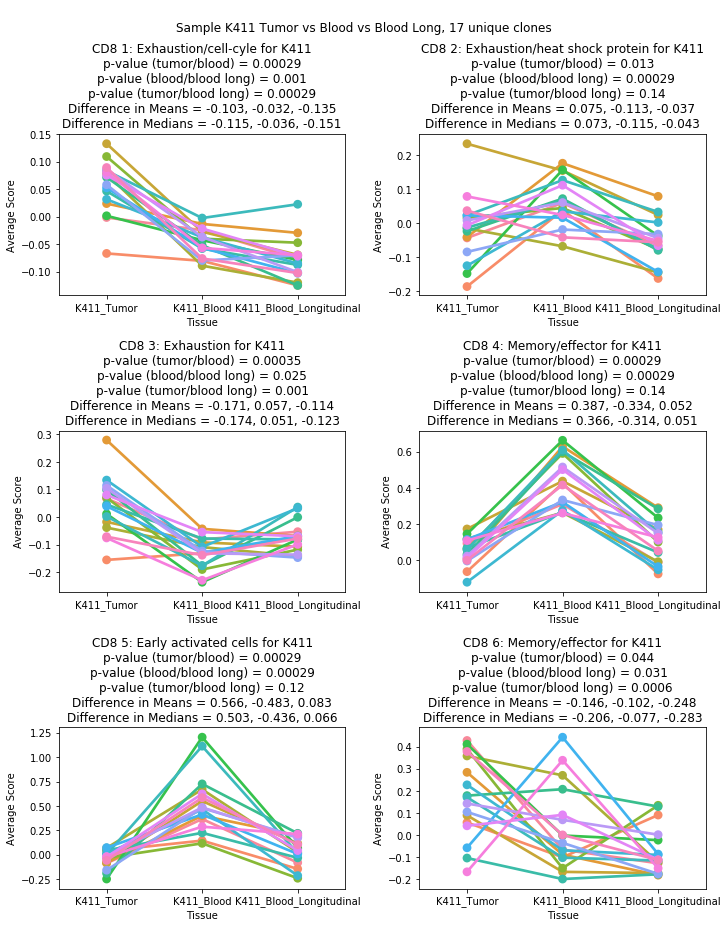


K468 Tumor vs Blood vs Blood Long



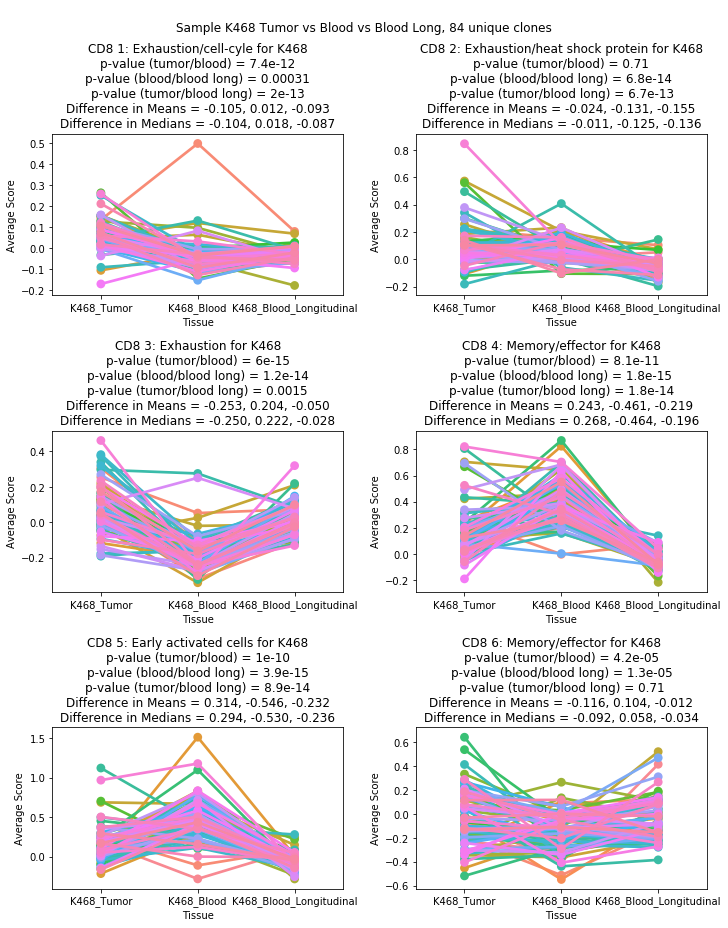

In [64]:
genes_to_use = SF_CD8
names_to_use = ['CD8 1: Exhaustion/cell-cyle', 'CD8 2: Exhaustion/heat shock protein',
                      'CD8 3: Exhaustion', 'CD8 4: Memory/effector',
                      'CD8 5: Early activated cells', 'CD8 6: Memory/effector']

for i,comparison in enumerate(comparisons):

    t1_meta = comparison[0]
    t1_mtx  = comparison[1]
    t2_meta = comparison[2]
    t2_mtx  = comparison[3]
    t3_meta = comparison[4]
    t3_mtx  = comparison[5]
    
    sample1 = list(t1_meta['Sample'])[0]
    sample2 = list(t2_meta['Sample'])[0]
    sample3 = list(t3_meta['Sample'])[0]
    
    print("\n{}\n".format(comparison_names[i]))
    
    fig, axes = plt.subplots(nrows=3,ncols=2, constrained_layout=True, figsize=(10,13))

    for j, (genelist,score_name) in enumerate(zip(genes_to_use,names_to_use)):

        Sample,title = SigAl3(sample1, sample2, sample3, t1_mtx, t1_meta, t2_mtx, t2_meta, t3_mtx, t3_meta,
                             genelist, score_name, scale_sd = True)

        # Determine the value of n,m from the value of j
        n,m = MakeNM(j)
            
        
        sns.pointplot(data = Sample,  x = "Tissue", y = score_name, hue = "TCR", ax=axes[n,m])
        axes[n,m].set_ylabel('Average Score')
        axes[n,m].legend_.remove()
        axes[n,m].set_title(title)        
        
    n_clones = len(Sample)/3
    fig.suptitle("\nSample {}, {} unique clones\n".format(comparison_names[i], int(n_clones)))        
        
    extent = full_extent(axes[1,0]).transformed(fig.dpi_scale_trans.inverted())
    fig.savefig('Figures/Fig5B_' + sample1[0:4] + '_SF_Exhausion_CloneAnalysis.pdf', bbox_inches=extent)  

        
    plt.show()

# Count Cells in each Cluster

In [71]:
def CountCells(df, sample):
    
    cluster_numbers = sorted(list(df.Seurat_clusters.unique()))
    
    GEX_list = []
    GEX_and_AB_list = []
    all_M_list = []
    
    cluster = 0
    while cluster <= max(cluster_numbers):

        cells = df[ df['Seurat_clusters'] == cluster ]

        GEX = len(cells)
        GEX_and_AB = len(AB_Clones(cells))
        all_M = len(cells[ cells['Matching'] == 'matching' ])
        
        
        
        GEX_list.append(GEX)
        GEX_and_AB_list.append(GEX_and_AB)
        all_M_list.append(all_M)
        cluster += 1
        
        
    # Find %matching
    PercentMatching = np.array(all_M_list)/np.array(GEX_and_AB_list)*100
    PercentMatching = np.round(PercentMatching, decimals=2)
    
    return GEX_list,GEX_and_AB_list,all_M_list,PercentMatching

In [72]:
df = pd.DataFrame()

for i,sample in enumerate(samples):
    
    total_GEX,GEX_and_AB,all_M,PercentMatching = CountCells(Meta[i], sample)
        
    if 'Blood' in sample:
        d = {'{} all GEX'.format(sample): total_GEX,
             '{} GEX_and_AB'.format(sample): GEX_and_AB,
             '{} TM cells'.format(sample): all_M,
             '{} Percent TM cells'.format(sample):PercentMatching}
    else:
        d = {'{} all GEX'.format(sample): total_GEX,
             '{} GEX_and_AB'.format(sample): GEX_and_AB,
             '{} BlM cells'.format(sample): all_M,
             '{} Percent BlM cells'.format(sample):PercentMatching}
        
    
    df1 = pd.DataFrame(data = d)
    
    df = pd.concat([df,df1], axis=1)
    
df.index.name = 'Cluster'



Sum = list(df.sum(axis=0, numeric_only = True))
Sum = list(map(int, Sum))

for n,num in enumerate(Sum):
    if 'Percent' in df.columns[n]:
        percent = Sum[n-1]/Sum[n-2]*100
        Sum[n] = np.round(percent, decimals=2)

df.loc['Sum'] = Sum
df = df.fillna('-')
df

/Users/oshahid/Desktop/Osmaan_Projects/Blood_Tumor/SignatureAnalysis/.venv/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in true_divide


,K409_Blood all GEX,K409_Blood GEX_and_AB,K409_Blood TM cells,K409_Blood Percent TM cells,K409_LN all GEX,K409_LN GEX_and_AB,K409_LN BlM cells,K409_LN Percent BlM cells,K409_Tumor all GEX,K409_Tumor GEX_and_AB,...,K468_Tumor BlM cells,K468_Tumor Percent BlM cells,K484_Blood all GEX,K484_Blood GEX_and_AB,K484_Blood TM cells,K484_Blood Percent TM cells,K484_Tumor all GEX,K484_Tumor GEX_and_AB,K484_Tumor BlM cells,K484_Tumor Percent BlM cells
Cluster,,,,,,,,,,,,,,,,,,,,,
0,1435,363,0,0,731,559,170,30.41,387,107,...,378,59.06,1015,197,114,57.87,412,169,87,51.48
1,812,202,0,0,576,301,11,3.65,295,205,...,0,0,853,380,39,10.26,326,64,0,0
2,691,193,0,0,536,245,106,43.27,257,49,...,73,17.26,657,121,63,52.07,282,109,18,16.51
3,639,231,0,0,487,319,17,5.33,238,97,...,143,39.5,656,337,20,5.93,272,212,6,2.83
4,588,179,0,0,451,176,16,9.09,205,47,...,0,0,585,133,67,50.38,213,108,3,2.78
5,399,116,0,0,404,245,0,0,140,90,...,11,4.6,331,71,20,28.17,150,95,0,0
6,154,66,0,0,387,250,21,8.4,138,54,...,1,0.37,233,45,3,6.67,85,10,1,10
7,152,110,0,0,233,69,2,2.9,103,58,...,23,14.29,174,43,0,0,80,19,5,26.32
8,133,37,0,0,172,126,43,34.13,94,55,...,3,1.76,134,11,1,9.09,57,43,4,9.3


# Create a function to count alpha and beta chains in TCR sequences

In [73]:
def CountTCRchains(df):
    
    TCR_list = list(df['TCR'])          # Make a list of each TCR sequence
    
    max_chain_a = 0
    max_chain_b = 0
    
    for TCR in TCR_list:
        if TCR == 'notcr' or TCR is np.nan:
            
            continue
            
        a = TCR.split("|")[0]
        b = TCR.split("|")[1] 
        
        if len(a.split("-")) >= max_chain_a:
            max_chain_a = len(a.split("-")) + 1
        
        if len(b.split("-")) >= max_chain_b:
            max_chain_b = len(b.split("-")) + 1
    
    count_array = np.zeros([max_chain_a,max_chain_b], int)

    # For each TCR,
    for TCR in TCR_list:
        
        # If TCR isn't sequenced, just skip the TCR
        if TCR == 'notcr':
            alpha = 0
            beta = 0

            
        else:        
            # Define 'a' as the alpha chain and 'b' as the beta chain
            a = TCR.split("|")[0]
            b = TCR.split("|")[1]
            
            
            if a == '':                          # If alpha chain doesn't exist,
                alpha = 0                        # count zero chains
            else:
                alpha = len(a.split("-"))        # Otherwise, count how many chains it has
            
            
            if b == '':                          # If beta chain doesn't exist,
                beta = 0                         # count zero chains
            else:
                beta = len(b.split("-"))         # Otherwise, count how many chains it has

        count_array[alpha,beta] += 1             # Add a value of 1 at the correct location
        
    return(count_array)

# Make alpha/beta heatmaps

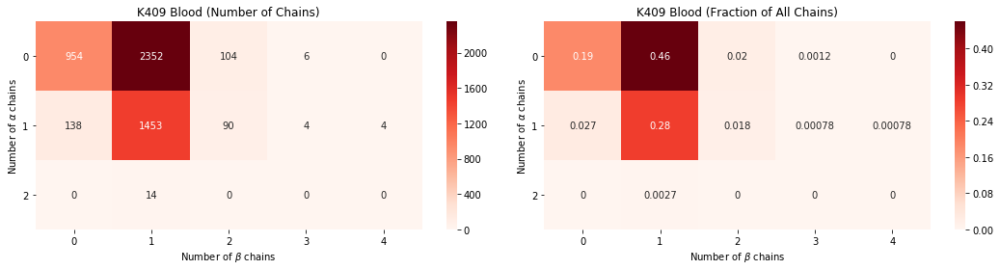

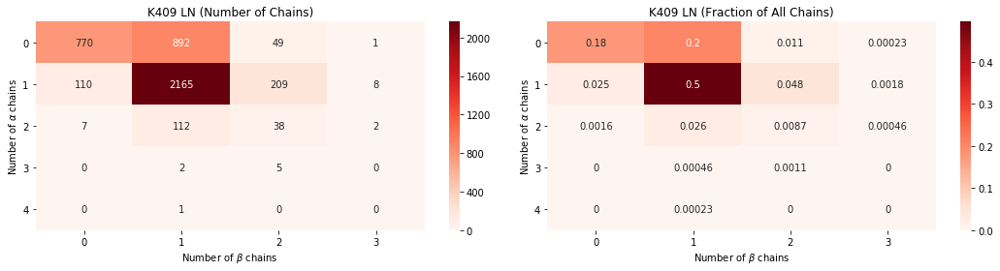

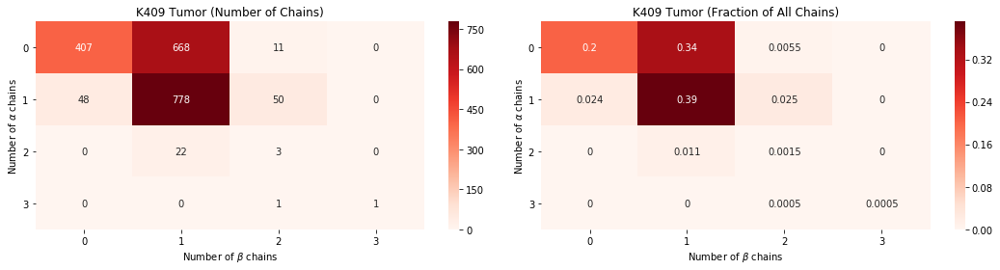

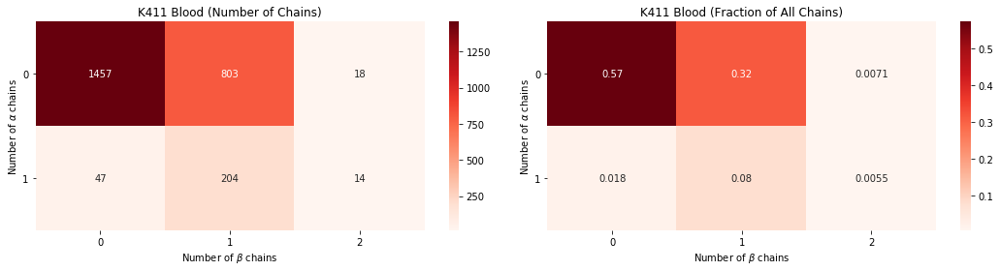

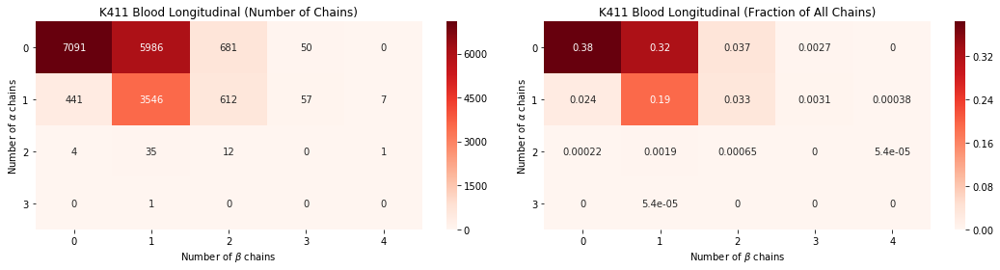

...

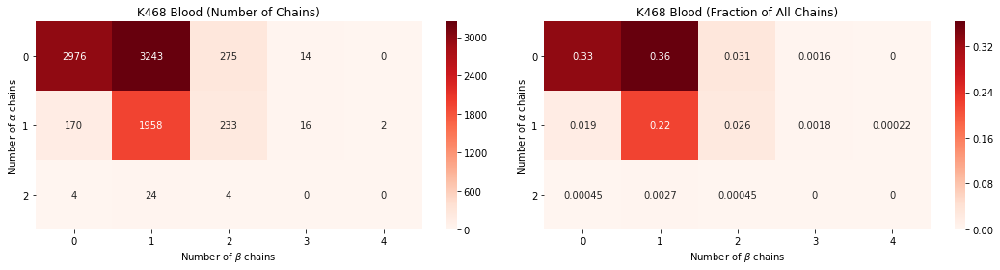

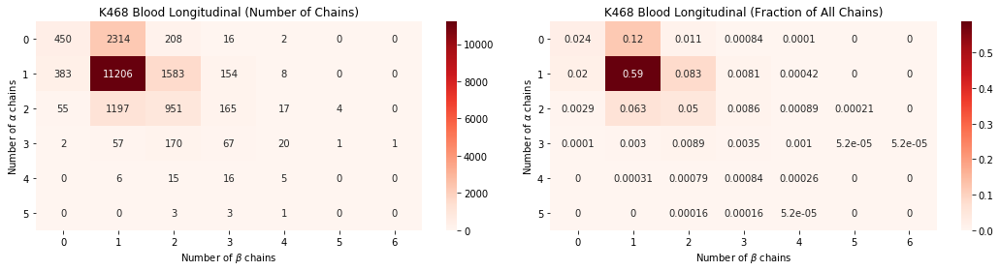

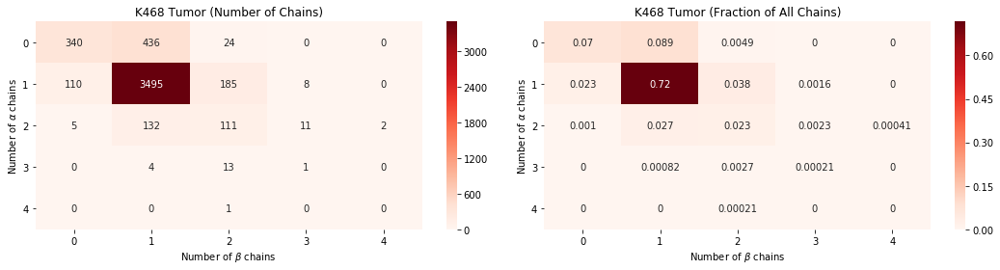

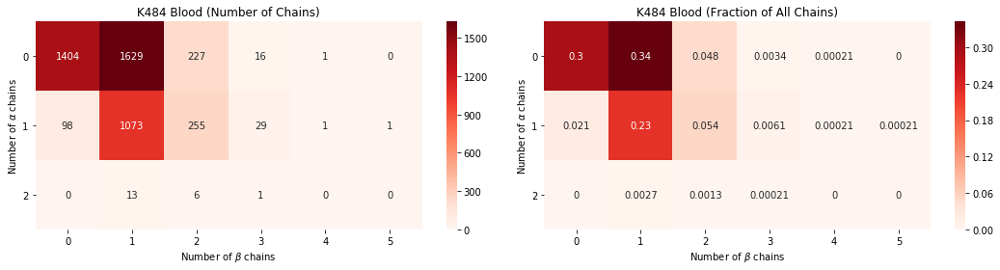

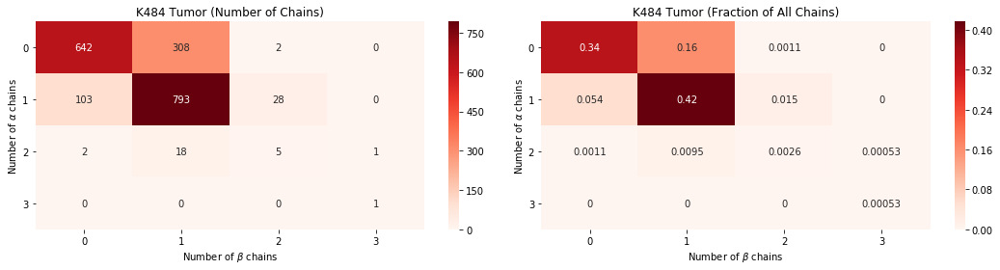

In [74]:
for i,sample in enumerate(Meta):
    
    mtx = CountTCRchains(sample)
    nmtx = mtx/np.sum(mtx)

    fig,(ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15,4))

    sns.heatmap(mtx, ax=ax1, cmap = 'Reds', annot=True, fmt="d")
    ax1.set_title(MakeTitle(samples[i]) + " (Number of Chains)")
    ax1.set_xlabel(r"Number of $\beta$ chains")
    ax1.set_ylabel(r"Number of $\alpha$ chains")
    ax1.tick_params(labelrotation=0)

    sns.heatmap(nmtx, ax=ax2, cmap = 'Reds', annot=True, fmt=".2g")
    ax2.set_title(MakeTitle(samples[i]) + " (Fraction of All Chains)")
    ax2.set_xlabel(r"Number of $\beta$ chains")
    ax2.set_ylabel(r"Number of $\alpha$ chains")
    ax2.tick_params(labelrotation=0)

    plt.tight_layout()
    plt.show()

# Make Data for SuppFig 3B

In [76]:
for i,sample in enumerate(samples):

    # Total number of GEX barcodes
    all_cells = len(Meta[i])
    
    # Keep only AB clones; total number of AB cells
    df = AB_Clones(Meta[i])
    ab_cells = len(df)
    
    # Total number (and percent) of matching cells
    matching = len(df[ df['Matching'] == 'matching'])
    perc_matching = np.round(matching/ab_cells * 100, decimals=2)
    
    # All cells that are matching in count matrix
    df_mtx = Mtxs[i].loc[ df[ df['Matching'] == 'matching'].index ]
    matching_PD1 = np.count_nonzero(df_mtx['PDCD1'])
    
    # Percentage of PD1+ cells that are matching
    matching_PD1 = np.round(matching_PD1/matching*100, decimals=2)
    
    data = [all_cells,ab_cells,matching,perc_matching,matching_PD1]

    print('For sample {}:'.format(sample))
    print('There are {} GEX barcodes, {} AB cells, and {} matching cells.'.format(*data[:3]))
    print('{:.2f}% of AB cells are tumor matching, and {:.2f}% of matching cells are PD1+.\n\n'.format(*data[3:]))

For sample K409_Blood:
There are 5119 GEX barcodes, 1565 AB cells, and 19 matching cells.
1.21% of AB cells are tumor matching, and 68.42% of matching cells are PD1+.


For sample K409_LN:
There are 4371 GEX barcodes, 2542 AB cells, and 568 matching cells.
22.34% of AB cells are tumor matching, and 66.20% of matching cells are PD1+.


For sample K409_Tumor:
There are 1989 GEX barcodes, 855 AB cells, and 355 matching cells.
41.52% of AB cells are tumor matching, and 71.83% of matching cells are PD1+.


For sample K411_Blood:
There are 2543 GEX barcodes, 218 AB cells, and 60 matching cells.
27.52% of AB cells are tumor matching, and 3.33% of matching cells are PD1+.


For sample K411_Blood_Longitudinal:
There are 18524 GEX barcodes, 4271 AB cells, and 189 matching cells.
4.43% of AB cells are tumor matching, and 1.06% of matching cells are PD1+.


For sample K411_Tumor:
There are 3737 GEX barcodes, 2291 AB cells, and 207 matching cells.
9.04% of AB cells are tumor matching, and 3.38% of 

# Make Venn Diagrams to Find Matching TCRs

### Make Function

In [85]:
def MakeVennDiagrams(sample, ax):
    
    b = samples.index(sample + '_Blood')
    t = samples.index(sample + '_Tumor')
    l = samples.index(sample + '_Blood_Longitudinal')
    
    blood = set(AB_Clones(Meta[b])['TCR'])
    tumor = set(AB_Clones(Meta[t])['TCR'])
    long = set(AB_Clones(Meta[l])['TCR'])
    
    subsets = [len(blood - tumor),
               len(tumor - blood),
               len(blood & tumor),
               len(long - blood - tumor),
               len(blood & long),
               len(tumor & long),
               len(blood & tumor & long)]
    
    venn3_unweighted(subsets = subsets, set_labels = ('Blood', 'Tumor', 'Blood Longitudinal'), alpha = 0.5,
                    ax = ax)
    
    ax.set_title(MakeTitle(sample))

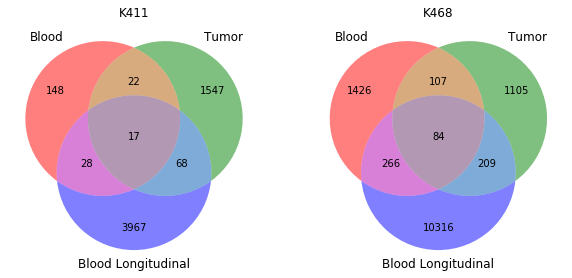

In [88]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize = (10,8))

for i,sample in enumerate(['K411', 'K468']):
    
    MakeVennDiagrams(sample, axes[i])
    
plt.savefig('Figures/Fig5A_VennDiagrams.pdf')

# Integrated Data

In [90]:
# Load samples
samples = ['HumanIntegratedBlood', 'HumanIntegratedTumor',
           'HumanIntegratedBlood_wLongitudinal']

# Initialize empty objects
Adatas = [0] * len(samples)

# Path where adata objects are located
adata_path = '/Users/oshahid/Desktop/RawData/Blood_Tumor/ProcessedData/ScanpyObjects/'

# Loop over each sample
for i,sample in enumerate(samples):
    
    Adatas[i] = anndata.read_h5ad(adata_path + sample + '.h5ad')
    
    print("{} cells in {}".format(len(Adatas[i]), sample))

21335 cells in HumanIntegratedBlood
16878 cells in HumanIntegratedTumor
58939 cells in HumanIntegratedBlood_wLongitudinal


### Make Helper Function to Make Plots

In [109]:
def MakeFigAxes(ncols, n_axes, figsize=(10,8), constrained_layout = False):
    
    # Determine how many rows are needed
    if n_axes%ncols == 0:
        nrows = int(n_axes/ncols)
    else:
        nrows = int(1+ int(n_axes/ncols))
    
    # Special case if only using one row
    if nrows == 1:
        fig, axes = plt.subplots(nrows = nrows, ncols = n_axes, figsize = figsize,
                                 constrained_layout = constrained_layout)
        axes = np.array(axes)
        axes.shape = (n_axes,)
    
    # For more than 1 row
    else:
        fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = figsize,
                                 constrained_layout = constrained_layout)
    
        # Delete unnecessary axes
        if n_axes != nrows*ncols:
            n_axes_to_delete = (nrows*ncols - n_axes)
            for i in range(1,n_axes_to_delete+1):
                ax = axes.flatten()[-i]
                fig.delaxes(ax)
                
    return fig, axes

# Plot Seurat Clusters

### Make Function

In [91]:
def PlotUMAPs(Adata, title, save=None):
    
    df = Adata.obs.copy()
    
    # Make a list of colors for the scatterplot
    Colors = list(plt.rcParams['axes.prop_cycle'].by_key()['color'])
    Colors2 = ['red','black','blue','green','orange','yellow','brown','magenta','pink','gray',
               'purple','tan','lightblue','lightgreen']

    Colors.extend(Colors2)
    
    # Maximum number of clusters
    seurat_list = list(df['Seurat_clusters'])
    max_cluster = len(list(np.unique(seurat_list)))
    
    # Make an empty list, each element will be a dataframe separated by cluster
    clusters = [0] * (max_cluster+1)
    
    # Make a list of colors that correspond to each seurat cluster
    c = []

    for cluster_number in list(df['Seurat_clusters']):
        c.append(Colors[cluster_number])


    # Plot the clusters  
    fig, ax = plt.subplots(figsize=(10,8))
    sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = df, hue = 'Seurat_clusters', palette=Colors[0:max_cluster],
                   legend = 'full', ax=ax, s = 10, linewidth=0)
    
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    
    new_labels = ['Cluster ' + str(i) for i in np.unique(df['Seurat_clusters'])]
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles[1:], labels=new_labels)
    
    ax.set_title(MakeTitle(title) + " ({} cells)".format(len(df)))
    
    if save is not None:
        plt.savefig(save)
        
    plt.show()
    
    return fig,ax

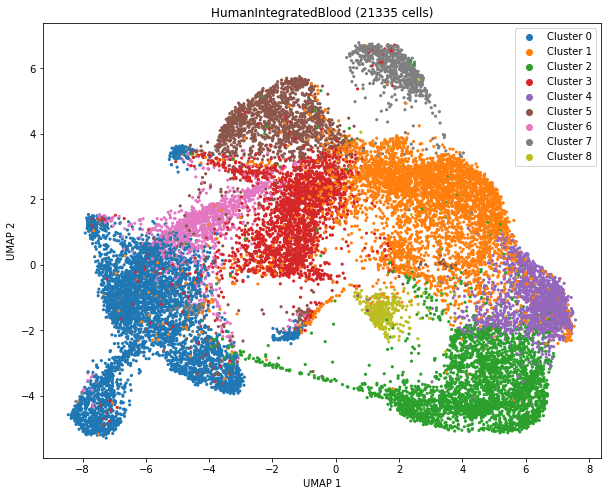

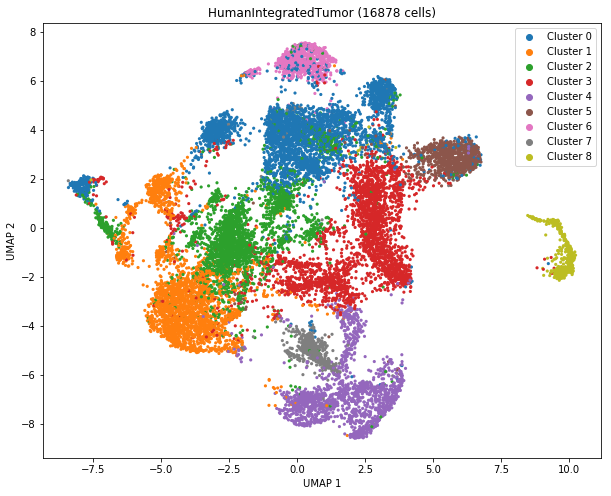

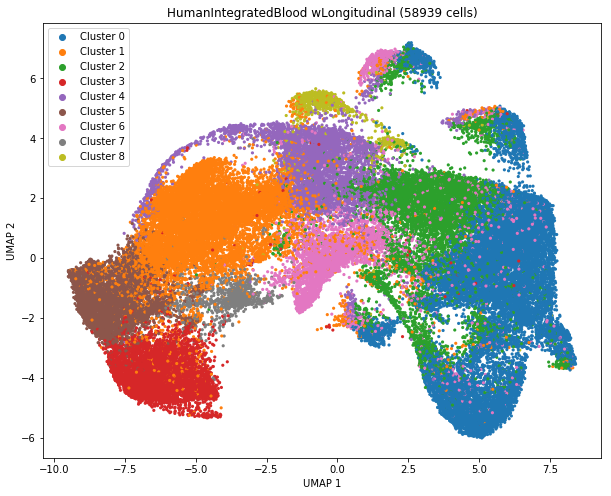

In [92]:
for i,sample in enumerate(samples):
    
    if sample == 'HumanIntegratedBlood':
        save = 'Figures/Fig4A_HumanIntBlood_clusters.pdf'
    else:
        save = None
    
    PlotUMAPs(Adatas[i], sample, save = save)

# Plot Certain Genes

In [107]:
def PlotGenes(Adata, sample):
    
    # Genes to plot
    genes = ['PDCD1', 'HAVCR2', 'SELL', 'TCF7', 'MKI67', 'GZMB']
    
    Adata = Adata.copy()
    
    # Normalize
    sc.pp.normalize_per_cell(Adata, counts_per_cell_after=1e4)
    sc.pp.log1p(Adata)
    sc.pp.scale(Adata)
    
    # Settings for Scanpy - directory to save and file format
    sc.settings.figdir = 'Figures/'
    sc.settings.file_format_figs = 'png'
    
    if sample == 'HumanIntegratedBlood':
        save = 'SuppFig4G_HumanIntBlood_genes.pdf'
        
    if sample == 'HumanIntegratedTumor':
        save = 'SuppFig4H_HumanIntTumor_genes.pdf'
        
    if sample == 'HumanIntegratedBlood_wLongitudinal':
        save = None
    
    sc.pl.umap(Adata, color = genes, ncols = 3, color_map = PurpOr_7.mpl_colormap, save=save)

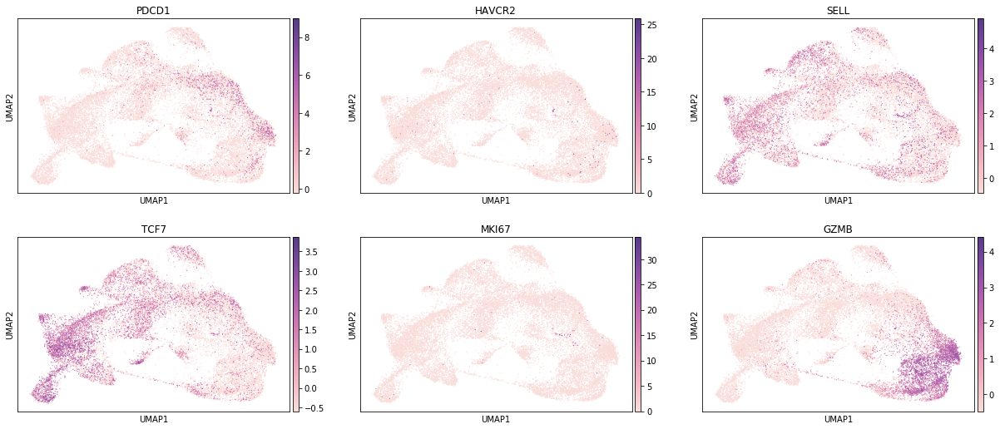

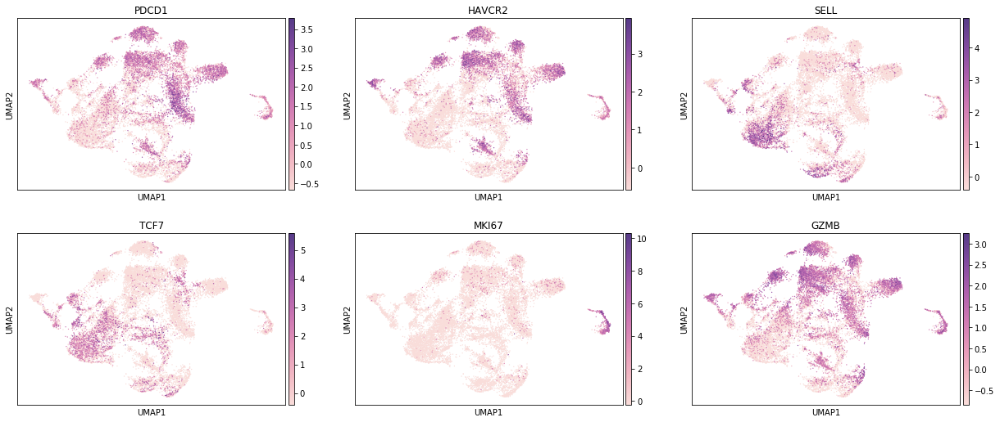

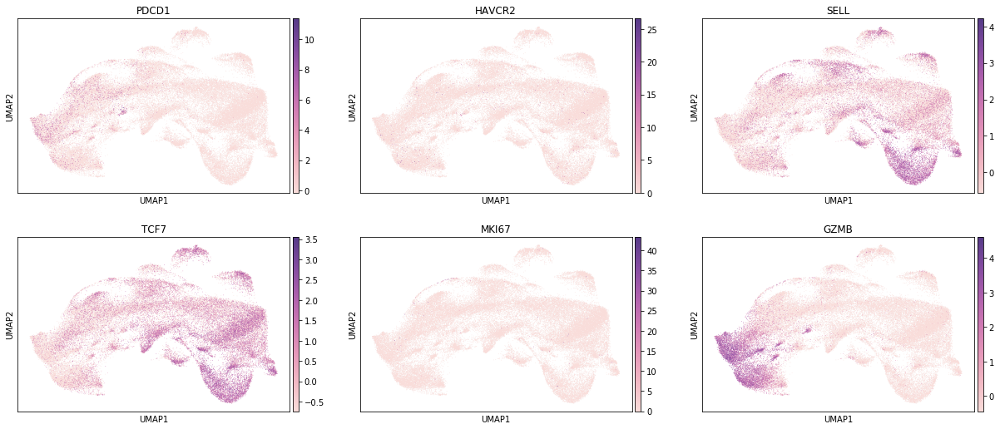

In [108]:
for i,sample in enumerate(samples):
    PlotGenes(Adatas[i], sample)

# Plot by Sample

### Create Function

In [103]:
def PlotBySample(Adata, sample):
    """
    Plots the cells from a given sample, and color them based on which sample the cell came from.
    """
    
    # Keep only AB cells
    df = Adata.obs.copy()
    
    # Set up figure
    fig, ax = plt.subplots(figsize=(10,8))
    
    # Define colors
    if sample == 'HumanIntegratedBlood':
        palette = ['red', 'green', 'blue', 'purple']
        hue_order = ['K409_Blood', 'K411_Blood', 'K468_Blood', 'K484_Blood']
        s = 5
        
    if sample == 'HumanIntegratedTumor':
        palette = ['red', 'red', 'green', 'blue', 'purple']
        hue_order = ['K409_Tumor', 'K409_LN', 'K411_Tumor', 'K468_Tumor', 'K484_Tumor']
        s = 3
        
    if sample == 'HumanIntegratedBlood_wLongitudinal':
        palette = ['red', 'green', 'blue', 'purple', 'orange', 'black']
        hue_order = ['K409_Blood',
                     'K411_Blood', 'K411_Blood_Longitudinal',
                     'K468_Blood', 'K468_Blood_Longitudinal',
                     'K484_Blood']
        s = 1
        
    # Plot data
    sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = df, hue = 'Sample', palette = palette,
                   hue_order = hue_order, ax = ax, s = s, linewidth = 0)
    
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    ax.set_title(MakeTitle(sample) + ' - {} Cells'.format(len(df)))
    
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles[1:], labels=labels[1:])
    
    plt.show()
    
    return fig, ax

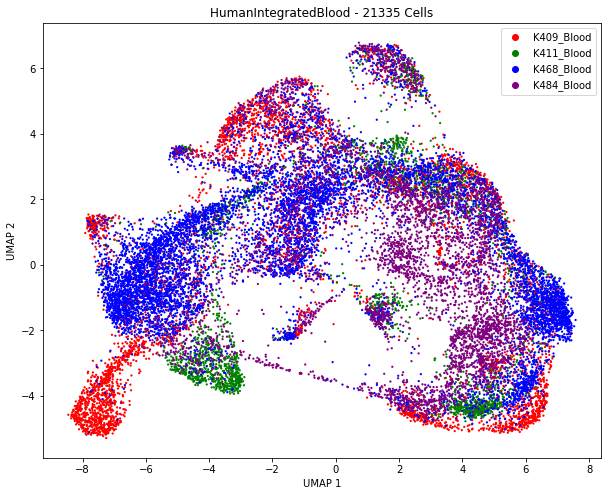

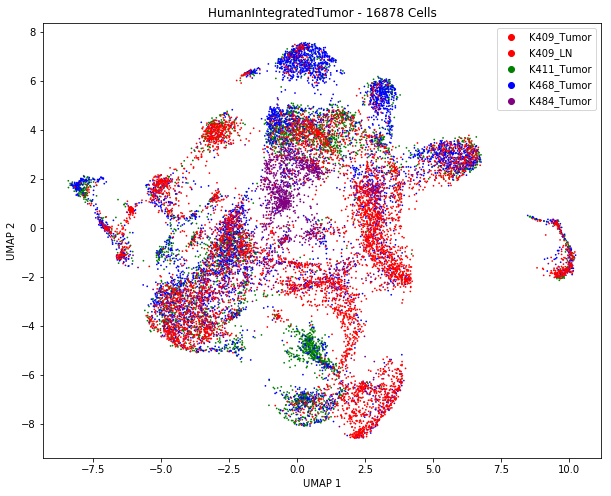

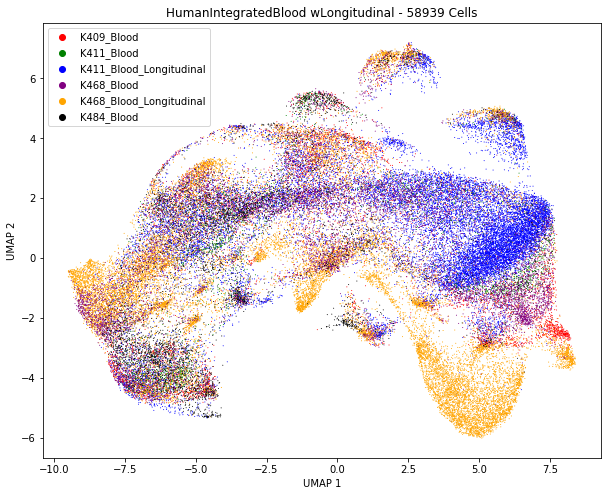

In [104]:
for i,sample in enumerate(samples):
    PlotBySample(Adatas[i], sample)

### Create Function to Plot by Individual Samples

In [105]:
def PlotByIndSamples(Adata, Sample):
    
    # Get the metadata dataframe
    df = Adata.obs.copy()
    
    # If Tumor, replace LN by tumor
    if Sample == 'HumanIntegratedTumor':
        df['Sample'].replace('K409_LN', 'K409_Tumor', inplace = True)
        
    # Individual samples
    ind_samples = list(sorted(df['Sample'].unique()))
    
    # Set up the plot
    if Sample in ['HumanIntegratedBlood', 'HumanIntegratedTumor']:
        fig, axes = MakeFigAxes(ncols = 2, n_axes = len(ind_samples), figsize = (18,16))
        colors = ['red', 'green', 'blue', 'purple']
        
    else:
        fig, axes = MakeFigAxes(ncols = 2, n_axes = len(ind_samples), figsize = (18,20))
        colors = ['red', 'green', 'blue', 'purple', 'orange', 'black']
    
    
    for i,sample in enumerate(ind_samples):
        
        # Get the axis
        ax = axes.flatten()[i]
        
        # Subset the dataframe
        sub = df[ df['Sample'] == sample ]
        
        # Make the plot
        sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = sub, color = colors[i], ax = ax,
                        linewidth = 0, s = 4)
        
        ax.set_xlabel('UMAP 1')
        ax.set_ylabel('UMAP 2')
        ax.set_title(MakeTitle(sample) + ', {} cells'.format(len(sub)))
        
    return fig, axes

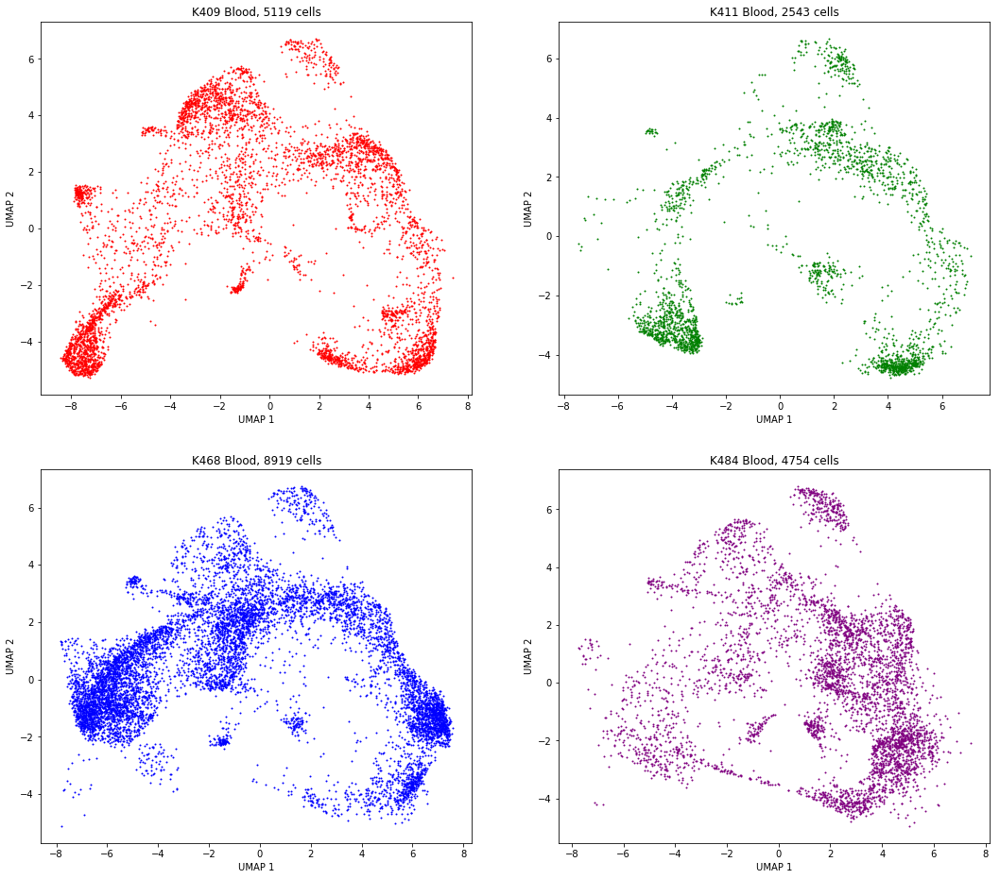

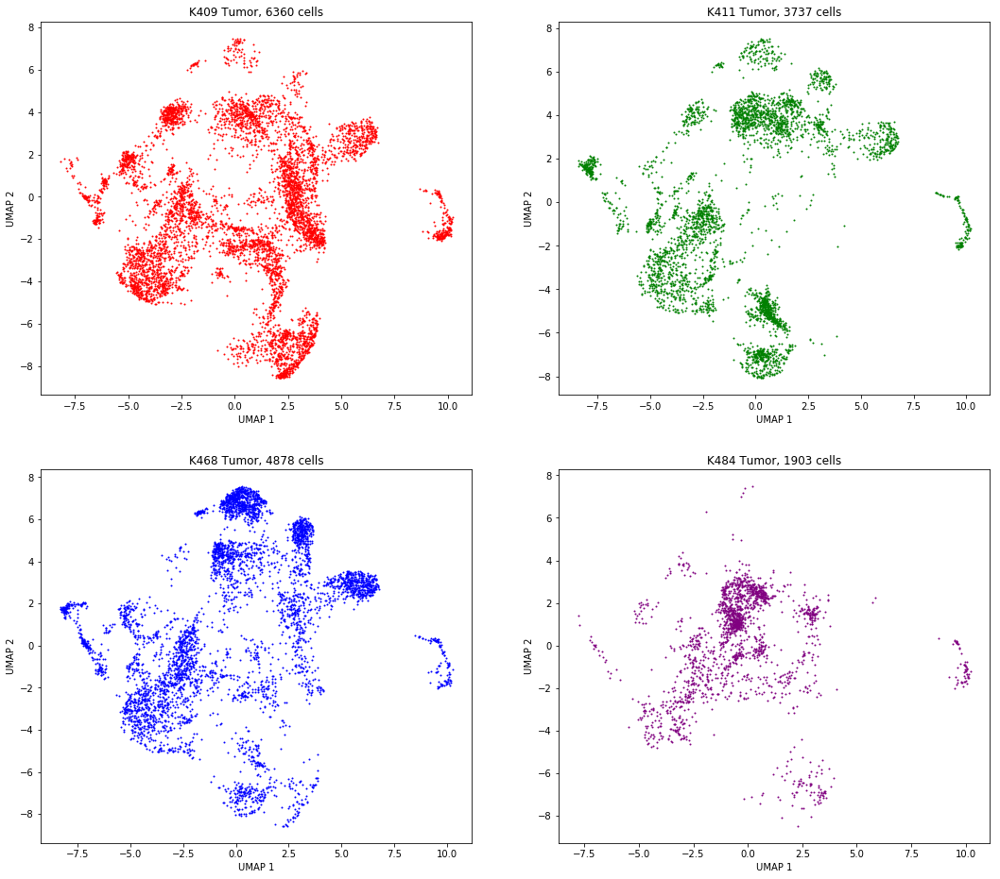

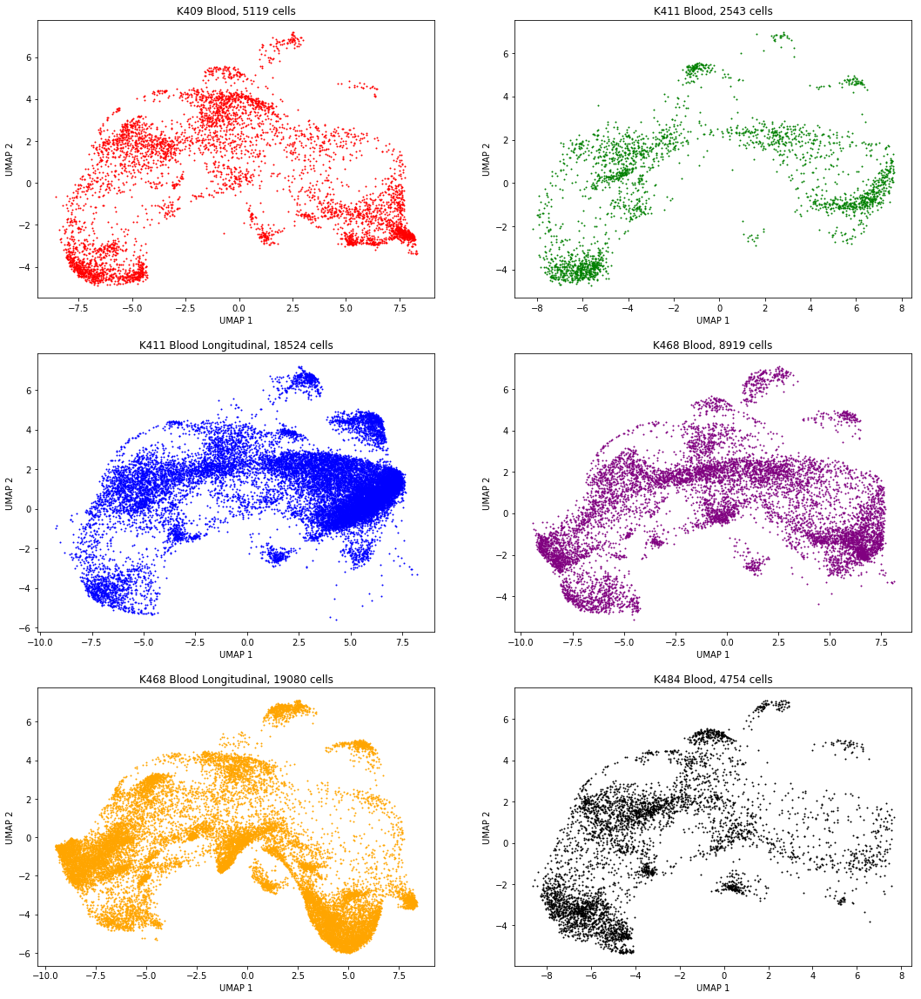

In [110]:
for i,sample in enumerate(samples):
    fig, axes = PlotByIndSamples(Adatas[i], sample)
    
    if sample == 'HumanIntegratedBlood':
        plt.savefig('Figures/SuppFig4C_HumanIntBlood_BySample.pdf')
        
    if sample == 'HumanIntegratedTumor':
        plt.savefig('Figures/SuppFig4D_HumanIntTumor_BySample.pdf')
        
    plt.show()

# Color UMAP by Matching

### Recreate Function

In [113]:
def Matching_UMAP(Adata, sample):
    """
    Plots the cells from a given sample, and color them based on whether or not the cell
    is an matching cell.
    """
    
    # Keep only AB cells
    df = AB_Clones(Adata.obs).copy()
    
    # Set up figure
    fig, ax = plt.subplots(figsize=(10,8))
    
    # Define colors
    if sample == 'HumanIntegratedBlood':
        palette = ['gray', 'brown', 'goldenrod', 'blue', 'green']
        hue_order = ['not_matching', 'K409_Blood_matching', 'K411_Blood_matching',
                     'K468_Blood_matching', 'K484_Blood_matching']
        s = 5
        
    if sample == 'HumanIntegratedTumor':
        palette = ['lightgray', 'brown', 'brown', 'blue', 'green', 'red']
        hue_order = ['not_matching', 'K409_Tumor_matching', 'K409_LN_matching', 'K411_Tumor_matching',
                     'K468_Tumor_matching', 'K484_Tumor_matching']
        s = 4
        
    if sample == 'HumanIntegratedBlood_wLongitudinal':
        palette = ['lightgray', 'red', 'green', 'blue', 'purple', 'orange', 'black']
        hue_order = ['not_matching', 'K409_Blood_matching',
                     'K411_Blood_matching', 'K411_Blood_Longitudinal_matching',
                     'K468_Blood_matching', 'K468_Blood_Longitudinal_matching',
                     'K484_Blood_matching']
        s = 1
    
    # Plot data
    sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = df, hue = 'Matching', palette = palette,
                   hue_order = hue_order, ax = ax, s = s, linewidth = 0)
    
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    ax.set_title(MakeTitle(sample) + ' - {} Cells'.format(len(df)))
    
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles[1:], labels=labels[1:])
    
    return fig, ax

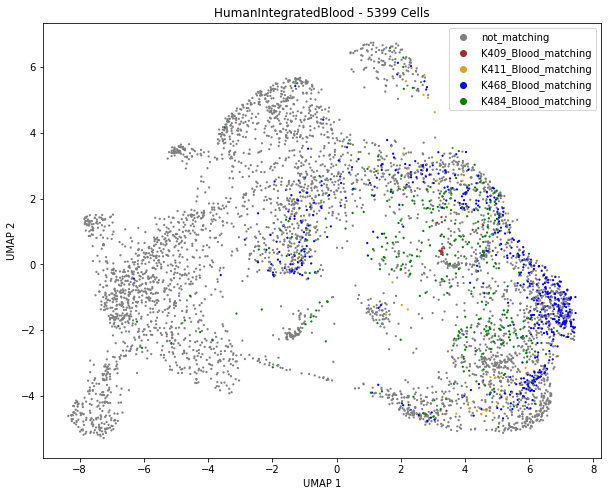

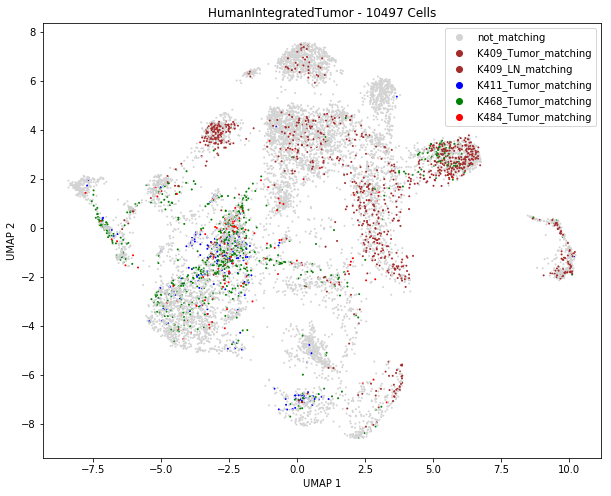

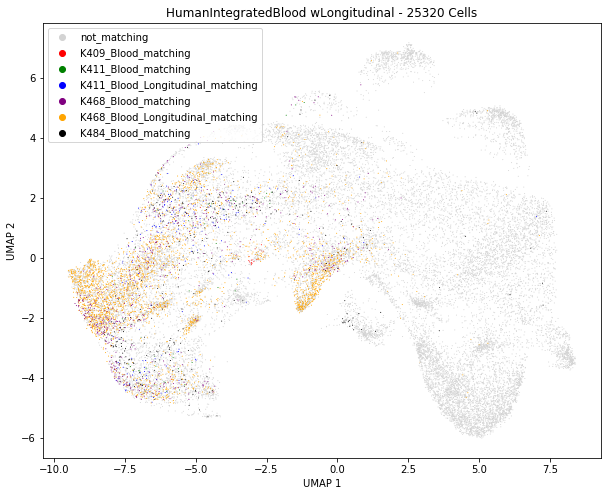

In [114]:
for i,sample in enumerate(samples):
    Matching_UMAP(Adatas[i], sample)
    
    if sample == 'HumanIntegratedBlood':
        plt.savefig('Figures/Fig4C_HumanIntBlood_ByMatching.pdf')
        
    plt.show()

### Create Function to Plot by Individual Matching

In [115]:
def PlotByIndMatching(Adata, Sample):
    
    # Get the metadata dataframe of AB cells
    df = AB_Clones(Adata.obs).copy()
    
    # If Tumor, replace LN by tumor
    if Sample == 'HumanIntegratedTumor':
        df['Matching'].replace('K409_LN_matching', 'K409_Tumor_matching', inplace = True)
        df['Sample'].replace('K409_LN', 'K409_Tumor', inplace = True)
        palette = ['navy', 'lightgray']
        figsize = (18,16)
        
    if Sample == 'HumanIntegratedBlood':
        palette = ['green', 'lightgray']
        figsize = (18,16)
        
    if Sample == 'HumanIntegratedBlood_wLongitudinal':
        palette = ['green', 'lightgray']
        figsize = (18,20)
        
    # Individual samples
    ind_samples = list(sorted(df['Sample'].unique()))
        
    # Set up the plot
    fig, axes = MakeFigAxes(ncols = 2, n_axes = len(ind_samples), figsize = figsize)

    
    for i,sample in enumerate(ind_samples):
        
        # Get the axis
        ax = axes.flatten()[i]
        
        # Subset the dataframe
        sub = df[ df['Sample'] == sample ]
        sub['Matching'].cat.remove_unused_categories(inplace=True)
        
        # Make the plot
        sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = sub, hue = 'Matching', ax = ax,
                        linewidth = 0, s = 4, palette = palette)
        
        ax.set_xlabel('UMAP 1')
        ax.set_ylabel('UMAP 2')
        ax.set_title(MakeTitle(sample) + ', {} cells'.format(len(sub)))
        
    return fig, axes

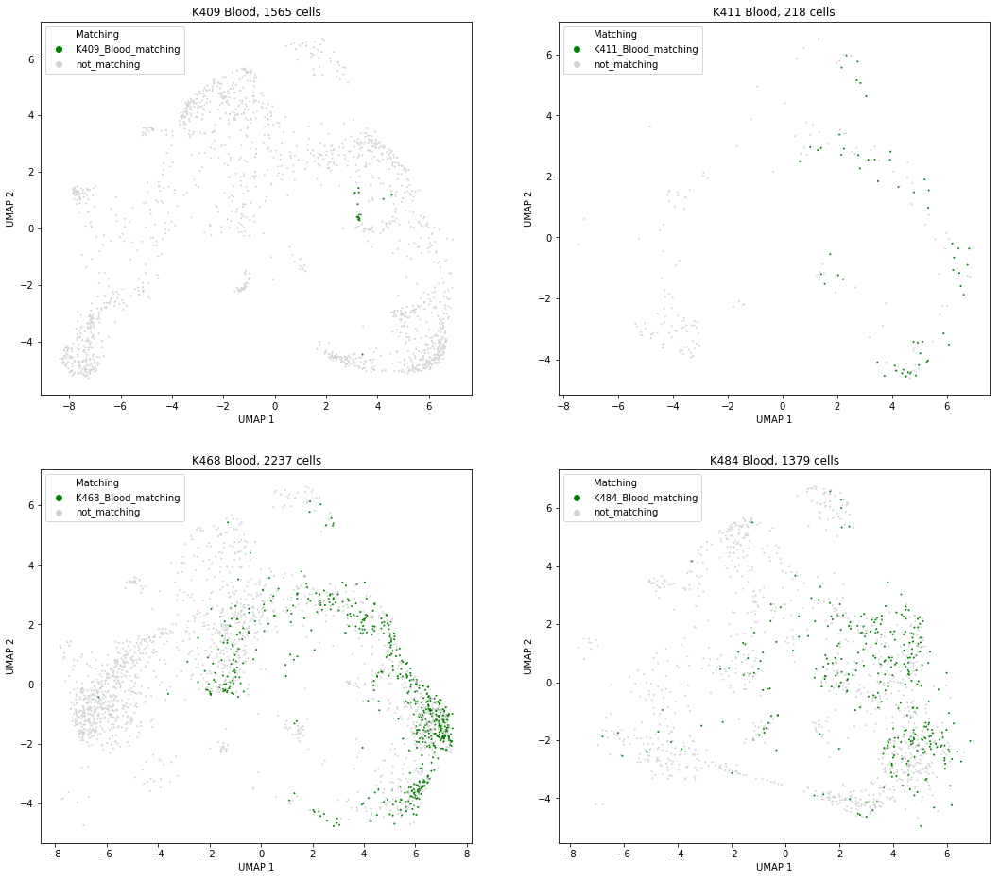

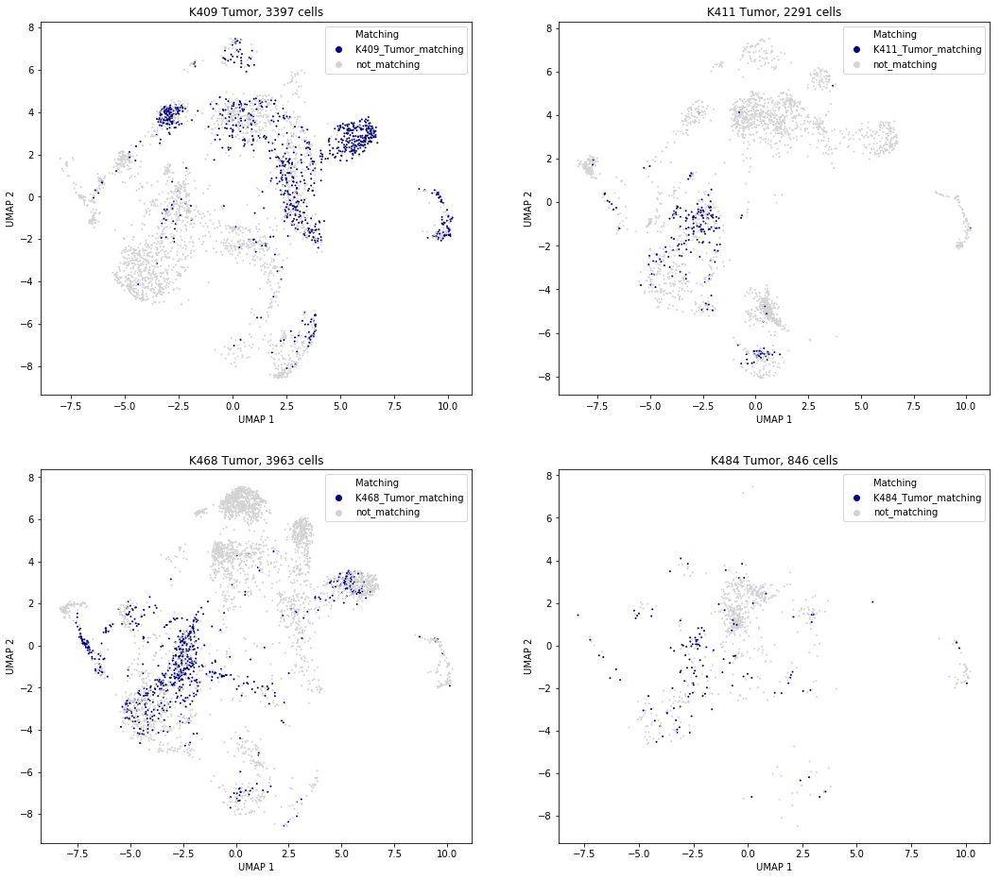

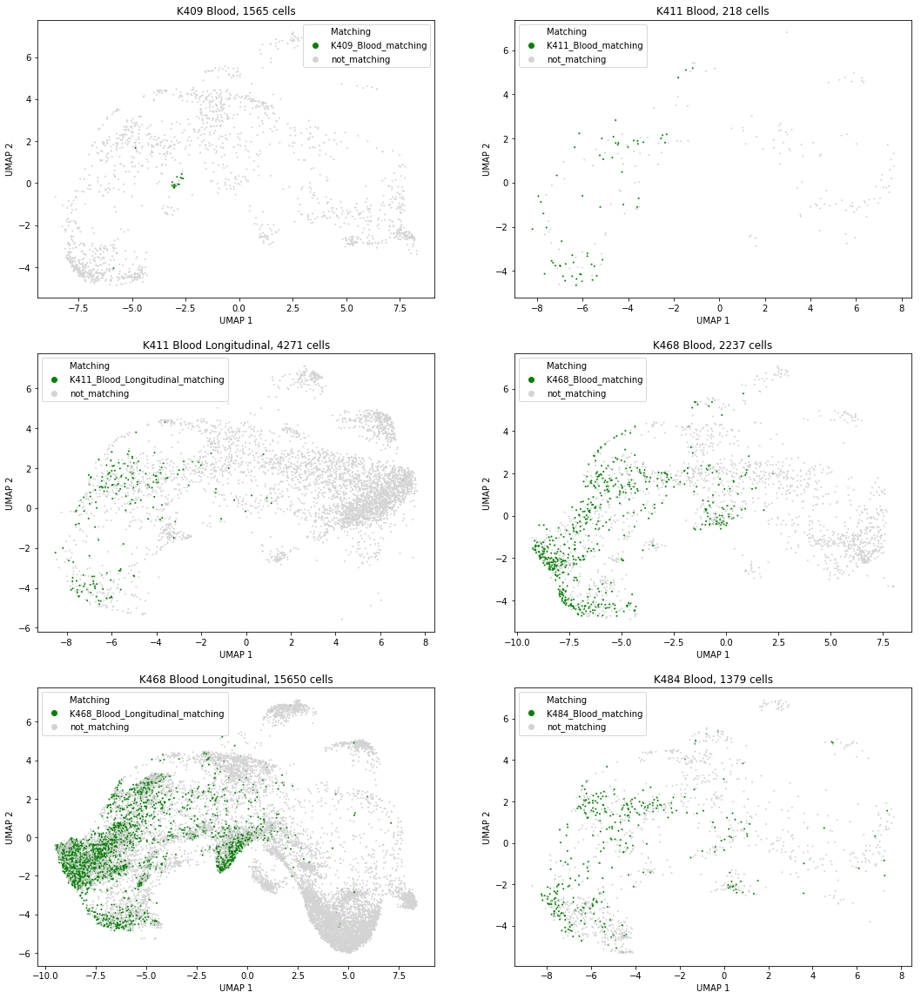

In [116]:
for i,sample in enumerate(samples):
    PlotByIndMatching(Adatas[i], sample)
    
    if sample == 'HumanIntegratedBlood':
        plt.savefig('Figures/SuppFig4E_HumanIntBlood_ByMatching.pdf')
        
    if sample == 'HumanIntegratedTumor':
        plt.savefig('Figures/SuppFig4F_HumanIntTumor_ByMatching.pdf')
        
    plt.show()